In [97]:
from astropy.io import fits
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as cm
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits.axes_grid1.anchored_artists import AnchoredSizeBar
import matplotlib.font_manager as fm
from matplotlib.patches import FancyArrowPatch
from matplotlib.transforms import Bbox
%matplotlib notebook
from scipy.interpolate import griddata
from scipy.ndimage import gaussian_filter
import astropy
from astropy import cosmology
from astropy.cosmology import FlatLambdaCDM
from astropy.coordinates import SkyCoord
from astropy.coordinates import SkyOffsetFrame
import astropy.units as unit
cosmo = FlatLambdaCDM(H0=100. * unit.km / unit.s / unit.Mpc, Om0=0.31)
c = 299792.458
from ellipsoid import*
from ellipsoid_fit import*
from scipy.optimize import curve_fit
from scipy import stats
import matplotlib.tri as mtri
import plotly.express as px

In [2]:
print(np.__version__)

1.23.1


The first part of the code imports the data defining Laniakea, derives the ellipsoid which best fits its geometry and smooths the reconstructed velocity field 

Reads the CF4 reconstruction from https://doi.org/10.1051/0004-6361/202245331 available at https://projets.ip2i.in2p3.fr//cosmicflows/

In [3]:
hdu = fits.open('CF4gp_new_64-z008_velocity.fits')
hdu_d = fits.open('CF4gp_new_64-z008_delta.fits')
# hdu_de = fits.open('CF4gp_new_64-z008_delta_error.fits')
hdu_e = fits.open('CF4gp_new_64-z008_velocity_cube_error.fits')
t = 52.*hdu[0].data
t_e = 52.*hdu_e[0].data
t_d = hdu_d[0].data

Imports Laniakea's surface in the form of a .obj file from https://projets.ip2i.in2p3.fr//cosmicflows/

In [4]:
def load_obj(filename):
    vertices = []
    faces = []
    lines = []
    with open(filename, 'r') as f:
        for line in f:
            if line.startswith('v '):
                vertices.append(list(map(float, line[2:].strip().split())))
            elif line.startswith('f '):
                face = list(map(int, line[2:].strip().split()))
                faces.append([i-1 for i in face])
            elif line.startswith('l '):
                line = list(map(int, line[2:].strip().split()))
                lines.append([i-1 for i in line])
    return np.array(vertices), np.array(faces), np.array(lines)

vertices, faces, lines = load_obj('laniakea.obj')

Find the coordinates of the imported surface in a 64^3 cells grid

In [5]:
Lania_surf = pd.DataFrame(vertices, columns=['X','Y','Z'])
u = Lania_surf["X"]
v = Lania_surf["Y"]
w = Lania_surf["Z"]
ii = np.rint(np.round(32. + ((64./1000.)*u),0)).astype(int)
jj = np.rint(np.round(32. + ((64./1000.)*v),0)).astype(int)
kk = np.rint(np.round(32. + ((64./1000.)*w),0)).astype(int)
#that's the Laniakea's mask velocity field
lania_surf_vv = t[:,kk,jj,ii]
lania_surf_cf4 = pd.DataFrame(np.column_stack((u,v,w,lania_surf_vv[2],lania_surf_vv[1],lania_surf_vv[0])),columns=["SGX","SGY","SGZ","vx","vy","vz"])
lania_surf_cf4.to_csv("laniakea_cf4_surf_velocities.csv", index = False, header = True)

Uses the ellipsoid fit function from https://github.com/aleksandrbazhin/ellipsoid_fit_python

In [6]:
ellipsoid = ellipsoid_fit(vertices)

center = ellipsoid[0]
axes = ellipsoid[2]
R = ellipsoid[1]

sgx_c = center[0]
sgy_c = center[1]
sgz_c = center[2]
ii_c = (32. + ((64./1000.)*sgx_c)).astype(int)
jj_c = (32. + ((64./1000.)*sgy_c)).astype(int)
kk_c = (32. + ((64./1000.)*sgz_c)).astype(int)
lania_v_c = t[:,ii_c,jj_c,kk_c]

Semiaxeslen=np.array((axes[0],axes[1],axes[2]))

Checks the goodness of the fit computing the average radius and its standard deviation

In [7]:
check01 = printAns3D(center,axes,R,vertices[:,0],vertices[:,1],vertices[:,2],"True")


Center at     -9.2335,  -47.0633,   85.0857
Axes gains    48.6154,  128.7463,  166.3854 
Rotation Matrix
   0.25957,   0.81427,   0.51922
   0.92221,  -0.36857,   0.11698
  -0.28662,  -0.44847,   0.84660

Transformation Matrix
 [[0.00848546 0.00248008 0.00215182]
 [0.00248008 0.01590222 0.00607978]
 [0.00215182 0.00607978 0.0099593 ]]

Average Radius      0.9723 (truth is 1.0)
Stdev of Radius     0.2339
 


Imports Laniakea's volume from https://arxiv.org/abs/2305.02339, available at https://projets.ip2i.in2p3.fr//cosmicflows/ as a grid of 0's and 1's of 128^3 cells 

In [8]:
watershed128 = np.load('CF4_new_128-z008_watershed_laniakea.npy')
indices128 = np.argwhere(watershed128 == 1)

watershed64 = np.zeros((64,64,64))
weightswatershed64=np.zeros((64,64,64))
for i in range(0,64):
    for j in range(0,64):
        for k in range(0,64):
            if watershed128[2*i,2*j,2*k]==1 or watershed128[2*i+1,2*j+1,2*k+1]==1:
                watershed64[i,j,k]=1
                weightswatershed64[i,j,k]=(watershed128[2*i,2*j,2*k] + watershed128[2*i+1,2*j,2*k]+watershed128[2*i,2*j+1,2*k] + watershed128[2*i,2*j,2*k+1]) + watershed128[2*i+1,2*j+1,2*k] +watershed128[2*i,2*j+1,2*k+1] +watershed128[2*i+1,2*j,2*k+1]+watershed128[2*i+1,2*j+1,2*k+1]   
indices64=np.argwhere(watershed64==1)
coords = indices128.astype(float)
coords = (coords - 64) * (1000 / 128)

#save the coordinates in a dataframe

lania_in = pd.DataFrame(coords, columns=['sgx', 'sgy', 'sgz'])
lania_in.to_csv('laniakea_cells.csv', index=False)


Computes the Bulk Flow as the average velocity inside

In [9]:
ii_in = np.rint(np.round(32. + ((64./1000.)*lania_in["sgx"]))).astype(int)
jj_in = np.rint(np.round(32. + ((64./1000.)*lania_in["sgy"]))).astype(int)
kk_in = np.rint(np.round(32. + ((64./1000.)*lania_in["sgz"]))).astype(int)
lania_v_in = t[:,kk_in,jj_in,ii_in]
sgx_bf = np.mean(lania_v_in[2]);sgy_bf = np.mean(lania_v_in[1]);sgz_bf = np.mean(lania_v_in[0])
sg_bf = [sgx_bf, sgy_bf, sgz_bf]


The following is to compute the radial velocity of any point in Laniakea with respect to any other point by using Cloud in a Cell interpolation, so that we can smooth the velocity field in the 64^3 grid for the positions obtained from the 128^3 grid.

In [10]:

def velocitycell(_ii,_jj,_kk):
    lania_vv_cell = t[:, _kk, _jj, _ii]
    return lania_vv_cell

def errvelocitycell(_ii,_jj,_kk):
    lania_vv_cell_err = t_e[_kk, _jj, _ii]
    return lania_vv_cell_err

# Requires coordinates for the point p to be given as numbers (not arrays)
def lania_v_point(_xp, _yp, _zp, _addbf=True):

    if _addbf:
        bulkflow = (sgx_bf,sgy_bf,sgz_bf)    
    else:
        bulkflow = (0,0,0)
       
    X=32. + (64./1000.)*(_xp)
    Y=32. + (64./1000.)*(_yp)
    Z=32. + (64./1000.)*(_zp)
    IX = int(X)
    IY = int(Y)
    IZ = int(Z)
    DX = X-IX
    DY = Y-IY
    DZ = Z-IZ
    TX = 1-DX
    TY = 1-DY
    TZ = 1-DZ
    v_point_cic =  (velocitycell(IX,IY,IZ) -bulkflow)*TX*TY*TZ + (velocitycell(IX+1,IY,IZ+1) -bulkflow)*TX*TY*DZ + (velocitycell(IX,IY+1,IZ) -bulkflow)*TX*DY*TZ 
    + (velocitycell(IX,IY+1,IZ+1) -bulkflow)*TX*DY*DZ + (velocitycell(IX+1,IY,IZ) -bulkflow)*DX*TY*TZ + (velocitycell(IX+1,IY,IZ+1)*DX*TY*DZ -bulkflow) 
    + (velocitycell(IX+1,IY+1,IZ) -bulkflow)*DX*DY*TZ + (velocitycell(IX+1,IY+1,IZ+1) -bulkflow)*DX*DY*DZ
    return v_point_cic

#The following can compute the error of each cell using CIC. However, in the end we decided to use 
#a flat error of 170 km/s for every point

def lania_v_point_err(_xp, _yp, _zp):
    
    nX=32. + (64./1000.)*(_xp)
    nY=32. + (64./1000.)*(_yp)
    nZ=32. + (64./1000.)*(_zp)
    nIX = int(nX)#.astype(int)
    nIY = int(nY)#.astype(int)
    nIZ = int(nZ)#.astype(int)
    nDX = nX-nIX
    nDY = nY-nIY
    nDZ = nZ-nIZ
    nTX = 1-nDX
    nTY = 1-nDY
    nTZ = 1-nDZ
    
#The following lines corresponds to the different choices of the dispersion used in the paper.
#Default is set for constant dispersion of 170 km/s

#     v_err_cic = np.sqrt( (((nTX*nTY*nTZ)**2)*(errvelocitycell(nIX,nIY,nIZ)**2+170**2) +((nTX*nTY*nDZ)**2)*(errvelocitycell(nIX+1,nIY,nIZ+1)**2+170**2) 
#     + ((nTX*nDY*nTZ)**2)*(errvelocitycell(nIX,nIY+1,nIZ)**2+170**2)   +((nTX*nDY*nDZ)**2)*(errvelocitycell(nIX,nIY+1,nIZ+1)**2+170**2) 
#     +((nDX*nTY*nTZ)**2)*(errvelocitycell(nIX+1,nIY,nIZ)**2+170**2)  +((nDX*nTY*nDZ)**2)*(errvelocitycell(nIX+1,nIY,nIZ+1)**2+170**2)  
#     +((nDX*nDY*nTZ)**2)*(errvelocitycell(nIX+1,nIY+1,nIZ)**2+170**2)+((nDX*nDY*nDZ)**2)*(errvelocitycell(nIX+1,nIY+1,nIZ+1)**2+170**2))/( (nTX*nTY*nTZ)**2 + (nTX*nTY*nDZ)**2 +(nTX*nDY*nTZ)**2+(nTX*nDY*nDZ)**2 +(nDX*nTY*nTZ)**2+(nDX*nTY*nDZ)**2 +(nDX*nDY*nTZ)**2+ (nDX*nDY*nDZ)**2 ))

#     v_err_cic = np.sqrt( (((nTX*nTY*nTZ)**2)*(errvelocitycell(nIX,nIY,nIZ)**2) +((nTX*nTY*nDZ)**2)*(errvelocitycell(nIX+1,nIY,nIZ+1)**2) 
#     + ((nTX*nDY*nTZ)**2)*(errvelocitycell(nIX,nIY+1,nIZ)**2)   +((nTX*nDY*nDZ)**2)*(errvelocitycell(nIX,nIY+1,nIZ+1)**2) 
#     +((nDX*nTY*nTZ)**2)*(errvelocitycell(nIX+1,nIY,nIZ)**2)  +((nDX*nTY*nDZ)**2)*(errvelocitycell(nIX+1,nIY,nIZ+1)**2)  
#     +((nDX*nDY*nTZ)**2)*(errvelocitycell(nIX+1,nIY+1,nIZ)**2)+((nDX*nDY*nDZ)**2)*(errvelocitycell(nIX+1,nIY+1,nIZ+1)**2))/( (nTX*nTY*nTZ)**2 + (nTX*nTY*nDZ)**2 +(nTX*nDY*nTZ)**2+(nTX*nDY*nDZ)**2 +(nDX*nTY*nTZ)**2+(nDX*nTY*nDZ)**2 +(nDX*nDY*nTZ)**2+ (nDX*nDY*nDZ)**2 ))
    
    v_err_cic = np.sqrt( (((nTX*nTY*nTZ)**2)*(170**2) +((nTX*nTY*nDZ)**2)*(+170**2) 
    + ((nTX*nDY*nTZ)**2)*(170**2)   +((nTX*nDY*nDZ)**2)*(170**2) 
    +((nDX*nTY*nTZ)**2)*(170**2)  +((nDX*nTY*nDZ)**2)*(170**2)  
    +((nDX*nDY*nTZ)**2)*(170**2)+((nDX*nDY*nDZ)**2)*(170**2))/( (nTX*nTY*nTZ)**2 + (nTX*nTY*nDZ)**2 +(nTX*nDY*nTZ)**2+(nTX*nDY*nDZ)**2 +(nDX*nTY*nTZ)**2+(nDX*nTY*nDZ)**2 +(nDX*nDY*nTZ)**2+ (nDX*nDY*nDZ)**2 )  ) 
    return v_err_cic     
    
# The following computes the radial velocity of the point p with respect to the point c

def lania_radial_velocity(_xp,_yp,_zp,_xc,_yc,_zc,_addbf=True,_addc=True):
 
    if _addc:
        epsilon=1
    else:
        epsilon=0
    if _addbf:
        BF=True
    else:
        BF=False
        
    radialvelocity= ( (lania_v_point(_xp,_yp,_zp,BF)[2]-epsilon*lania_v_point(_xc,_yc,_zc,BF)[2])*(_xp-_xc) 
                     +(lania_v_point(_xp,_yp,_zp,BF)[1]-epsilon*lania_v_point(_xc,_yc,_zc,BF)[1])*(_yp-_yc)
                     +(lania_v_point(_xp,_yp,_zp,BF)[0]-epsilon*lania_v_point(_xc,_yc,_zc,BF)[0])*(_zp-_zc))/(
                     np.sqrt( (_xp-_xc)**2+(_yp-_yc)**2+(_zp-_zc)**2))
    
    return radialvelocity

def lania_rad_vel_err(_xp,_yp,_zp,_xc,_yc,_zc,_addc=True):
    if _addc:
        epsilon=1
    else:
        epsilon=0
            
    sumerr= np.sqrt((lania_v_point_err(_xp, _yp, _zp))**2.0+ epsilon*(lania_v_point_err(_xc, _yc, _zc))**2.0) 

    return sumerr    

def distancefromcenter(_xp,_yp,_zp,_xc,_yc,_zc):
    
    distance= np.sqrt((_xp-_xc)**2 +(_yp -_yc)**2 + (_zp-_zc)**2 )
    return distance   

Plots Laniakea and the best fit ellipsoid

<IPython.core.display.Javascript object>


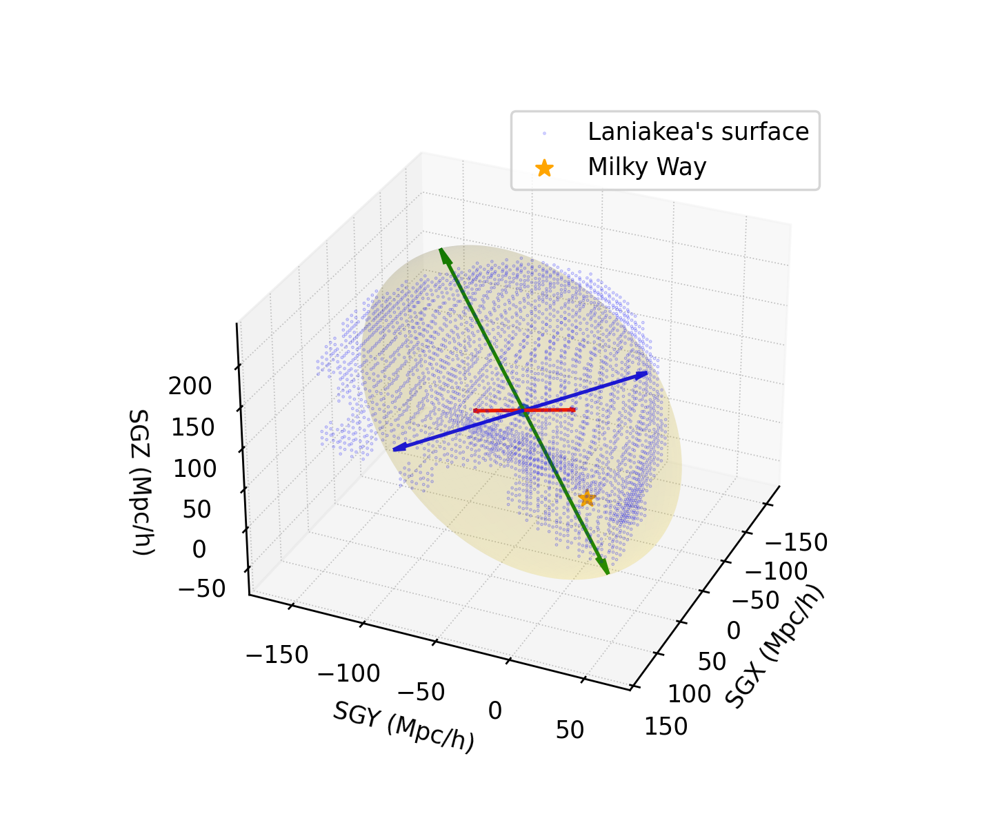

In [11]:
uu = np.linspace(0, 2 * np.pi, 100)
vv = np.linspace(0, np.pi, 100)
x = axes[0] * np.outer(np.cos(uu), np.sin(vv))
y = axes[1] * np.outer(np.sin(uu), np.sin(vv))
z = axes[2] * np.outer(np.ones_like(uu), np.cos(vv))
for i in range(len(x)):
    for j in range(len(x)):
        [x[i,j], y[i,j], z[i,j]] = np.dot([x[i,j], y[i,j], z[i,j]], R) + center
                
semiaxea= np.dot([axes[0], 0, 0], R) #+ center
semiaxeb= np.dot([ 0, axes[1], 0], R) #+ center
semiaxec= np.dot([ 0, 0,axes[2]], R) #+ center

# Plot the ellipsoid
fig = plt.figure(figsize=(5.8,4.8))
ax = fig.add_subplot(111, projection='3d')
ax.set_xlim(-175.,150.)
ax.set_ylim(-175.,75.)
ax.set_zlim(-100.,250.)

#Plot Laniakea's surface
d01 = ax.scatter(Lania_surf.X,Lania_surf.Y,Lania_surf.Z,c='blue',s=0.1,alpha=0.3,label='Laniakea\'s surface')
ax.plot_surface(x, y, z, color='gold', alpha=0.1)



#Plot MW
ax.scatter(0,0,0,color="orange",marker='*',s=50,label='Milky Way')
ax.legend()
# Plot Ellipsoid semiaxes
ax.scatter(center[0],center[1],center[2])
ax.quiver(center[0], center[1], center[2], semiaxea[0]*-1.0, semiaxea[1]*-1.0, semiaxea[2]*-1.0, color='r', length=1.0, arrow_length_ratio=0.1)
ax.quiver(center[0], center[1], center[2], semiaxeb[0]*-1.0, semiaxeb[1]*-1.0, semiaxeb[2]*-1.0, color='b', length=1.0, arrow_length_ratio=0.1)
ax.quiver(center[0], center[1], center[2], semiaxec[0]*-1.0, semiaxec[1]*-1.0, semiaxec[2]*-1.0, color='g', length=1.0, arrow_length_ratio=0.1)
ax.quiver(center[0], center[1], center[2], semiaxea[0]*1.0, semiaxea[1]*1.0, semiaxea[2]*1.0, color='r', length=1.0, arrow_length_ratio=0.1)
ax.quiver(center[0], center[1], center[2], semiaxeb[0]*1.0, semiaxeb[1]*1.0, semiaxeb[2]*1.0, color='b', length=1.0, arrow_length_ratio=0.1)
ax.quiver(center[0], center[1], center[2], semiaxec[0]*1.0, semiaxec[1]*1.0, semiaxec[2]*1.0, color='g', length=1.0, arrow_length_ratio=0.1)

ax.xaxis._axinfo["grid"].update({"linewidth":0.5, "color" : "0.75","linestyle" :":"})
ax.yaxis._axinfo["grid"].update({"linewidth":0.5, "color" : "0.75","linestyle" :":"})
ax.zaxis._axinfo["grid"].update({"linewidth":0.5, "color" : "0.75","linestyle" :":"})

# Create cubic bounding box to simulate equal aspect ratio
# X = lania_cf4_wo_bf_c_vr.SGX
# Y = lania_cf4_wo_bf_c_vr.SGY
# Z = lania_cf4_wo_bf_c_vr.SGZ

plt.xlabel("SGX (Mpc/h)")
plt.ylabel("SGY (Mpc/h)")
ax.set_zlabel("SGZ (Mpc/h)")
ax.view_init(elev=30, azim=24)
plt.axis('equal')
plt.xlim(-175.,150.)
plt.ylim(-175.,75.)
plt.savefig('Ellipse_fit_Fin.png', dpi=300)
# plt.zlim(-100.,250.)
plt.show()

The following cells provide the projections of the above along orthogonal axes in the supergalactic Cartesian frame

<IPython.core.display.Javascript object>


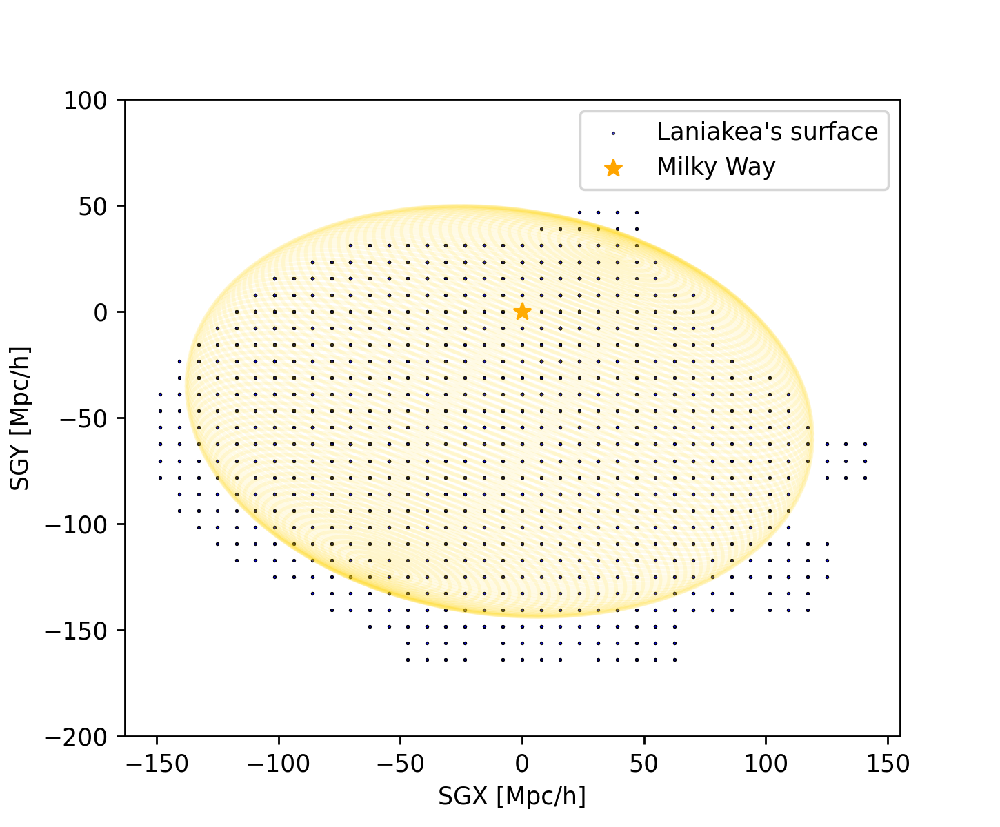

In [12]:
#Z projection

fig = plt.figure(figsize=(5.8,4.8))
ax = fig.add_subplot(111)
# ax.set_zlim(-100.,250.)

#Plot Laniakea's surface
d01 = ax.scatter(Lania_surf.X,Lania_surf.Y,c='blue',s=1,alpha=0.7,edgecolors='black',linewidths=0.5,label='Laniakea\'s surface')
ax.plot(x, y, color='gold', alpha=0.1)
plt.legend(loc="upper right")

plt.xlabel("SGX [Mpc/h]")
plt.ylabel("SGY [Mpc/h]")

#Plot MW
ax.set_ylim(-200,100)
ax.scatter(0,0,color="orange",marker='*',s=50,label='Milky Way')
plt.legend(loc="upper right")
#plt.legend(bbox_to_anchor=(0.65, 1.07), loc='upper left')
#plt.axis('equal')
plt.savefig('Z_projection_fit_fin.png', dpi=300)
plt.show()


<IPython.core.display.Javascript object>


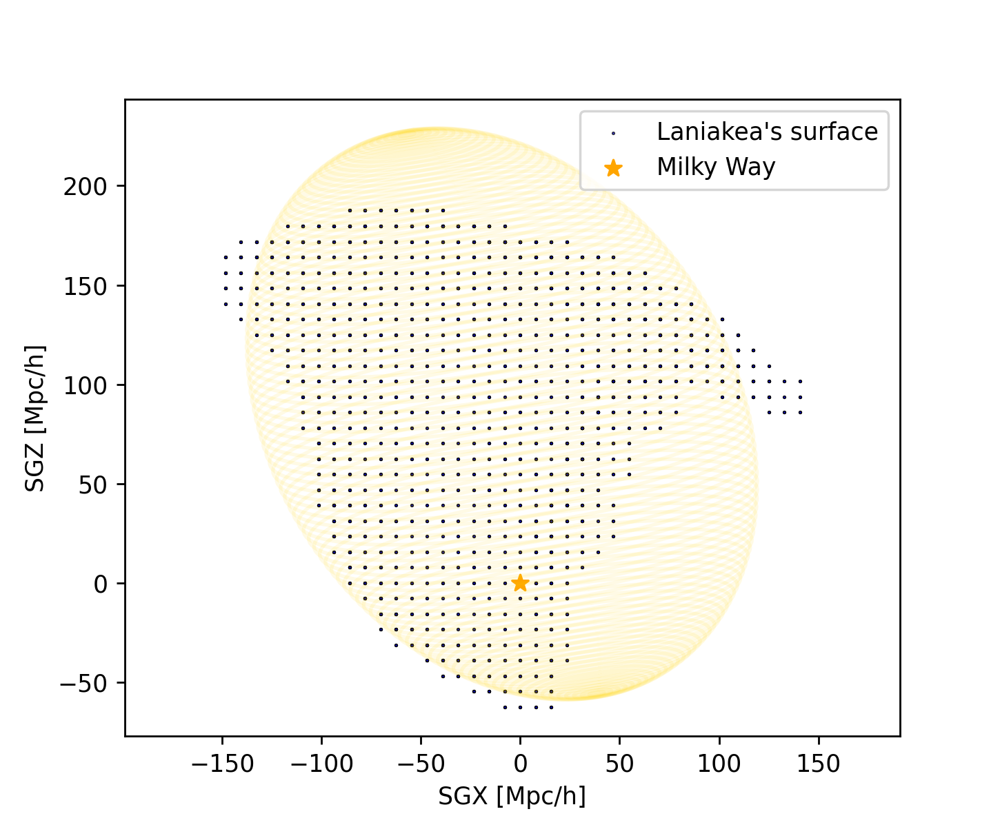

In [13]:
#Y projection

fig = plt.figure(figsize=(5.8,4.8))
ax = fig.add_subplot(111)
ax.set_xlim(-175.,150.)
# ax.set_ylim(-175.,75.)
ax.set_ylim(-100.,250.)

#Plot Laniakea's surface
d01 = ax.scatter(Lania_surf.X,Lania_surf.Z,c='blue',s=1,alpha=0.7,edgecolors='black',linewidths=0.5,label='Laniakea\'s surface')
ax.plot(x, z, color='gold', alpha=0.1)

plt.xlabel("SGX [Mpc/h]")
plt.ylabel("SGZ [Mpc/h]")
plt.axis('equal')
#Plot MW
ax.scatter(0,0,color="orange",marker='*',s=50,label='Milky Way')
plt.legend(loc="upper right")
plt.savefig('Y_projection_fit_fin.png', dpi=300)
plt.show()

<IPython.core.display.Javascript object>


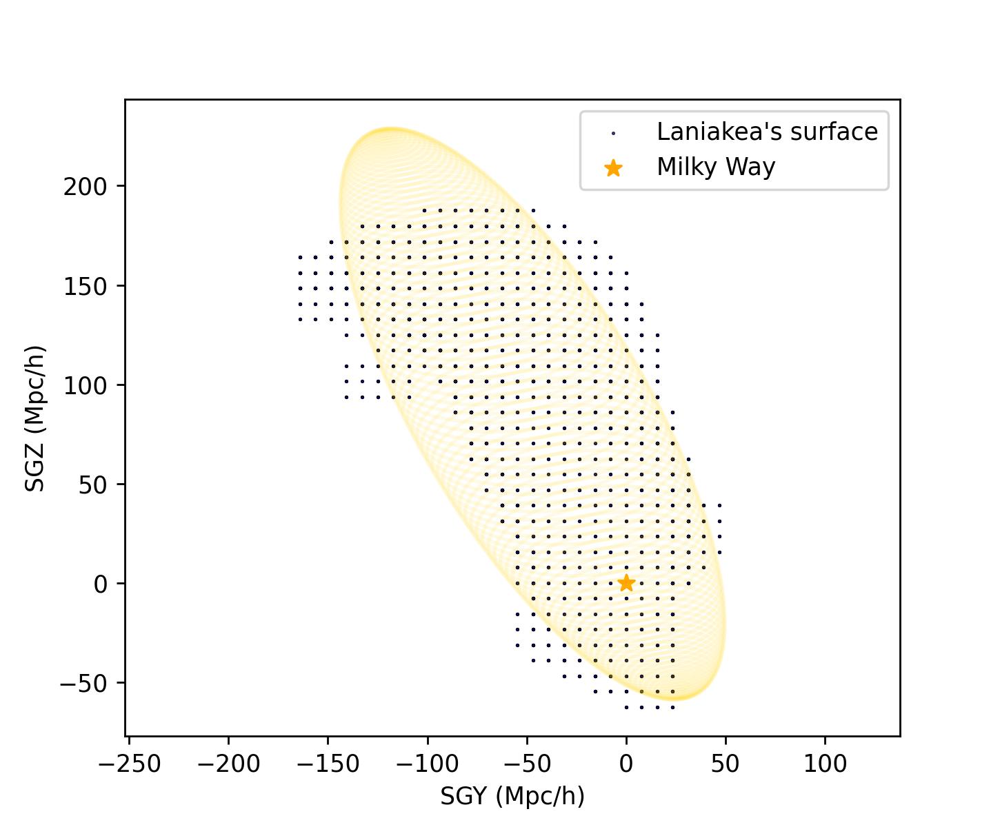

In [14]:
#X projection

fig = plt.figure(figsize=(5.8,4.8))
ax = fig.add_subplot(111)
#Plot Laniakea's surface
d01 = ax.scatter(Lania_surf.Y,Lania_surf.Z,c='blue',s=1,alpha=0.7,edgecolors='black',linewidths=0.5,label='Laniakea\'s surface')
ax.plot(y, z, color='gold', alpha=0.1)
plt.axis('equal')
#Plot MW
ax.scatter(0,0,color="orange",marker='*',s=50,label='Milky Way')
plt.legend(loc="upper right")
plt.xlabel("SGY (Mpc/h)")
plt.ylabel("SGZ (Mpc/h)")
plt.savefig('X_projection_fit_fin.png', dpi=300)
plt.show()

Plots Laniakea and its mask separately

<IPython.core.display.Javascript object>


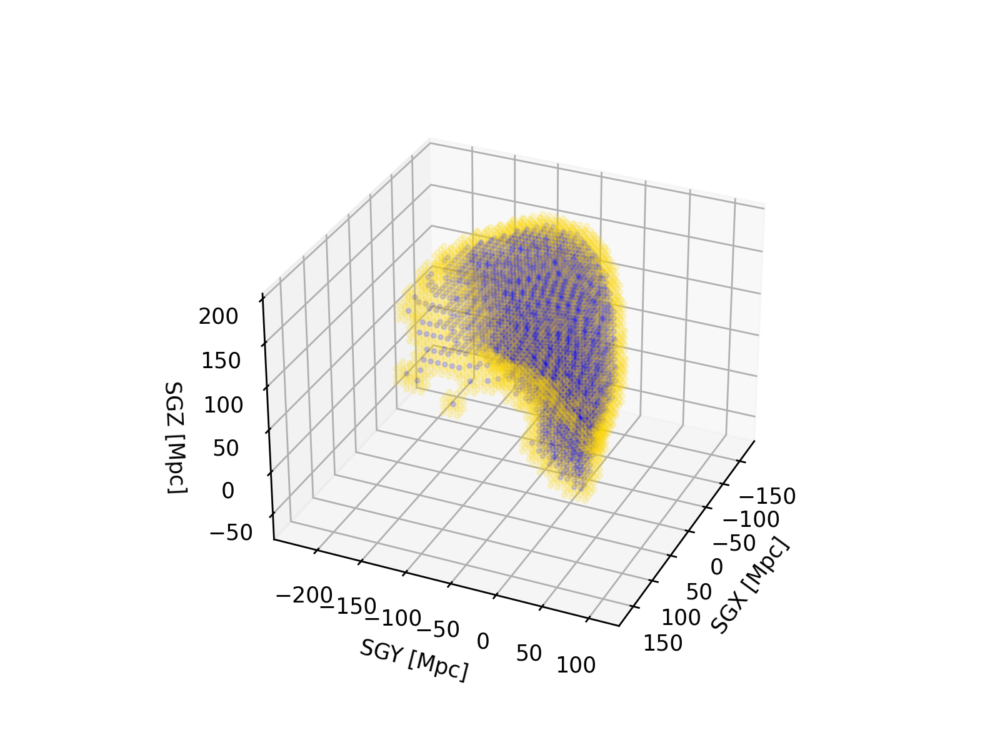

In [15]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
# ax.scatter(lania_in_128.sgx,lania_in_128.sgy,lania_in_128.sgz,s=5,alpha=0.05,color='blue')
ax.scatter(lania_in.sgx,lania_in.sgy,lania_in.sgz,s=4,alpha=0.2,color='blue')
ax.scatter(lania_surf_cf4.SGX,lania_surf_cf4.SGY,lania_surf_cf4.SGZ,s=5,alpha=0.15,color='gold')

plt.show()
plt.xlabel("SGX [Mpc]")
plt.ylabel("SGY [Mpc]")
ax.set_zlabel("SGZ [Mpc]")
ax.view_init(elev=30, azim=24)
plt.xlim(-175.,150.)
plt.ylim(-175.,75.)
plt.axis('equal')
plt.show()

In this second part of the code we proceed and fit the radial velocity field with the triaxial model.

The following functions compute the expected radial velocity in the triaxially expanding model for any point in the map with respect to any other

In [16]:
deltah= 1000/64
edg=deltah/2
# #predict radial velocities for any point within the ellipsoid for the BI model:

def recvelBI(_xp,_yp,_zp,_xc,_yc,_zc,_Ha,_Hb,_Hc):
    rotcoord= np.dot([_xp-_xc,_yp-_yc,_zp-_zc],R.T)
    recvel= (_Ha*(rotcoord[0])**2+_Hb*(rotcoord[1])**2 +_Hc*(rotcoord[2])**2)/(distancefromcenter(rotcoord[0],rotcoord[1],rotcoord[2],0,0,0))
    
    return recvel

def err_recvelBI(_xp,_yp,_zp,_xc,_yc,_zc,_Ha_err,_Hb_err,_Hc_err):
    rotcoord= np.dot([_xp-_xc,_yp-_yc,_zp-_zc],R.T)
    rec_vel_err= np.sqrt( ((_Ha_err*(rotcoord[0])**2)/(distancefromcenter(_xp,_yp,_zp,_xc,_yc,_zc)))**2 +((_Hb_err*(rotcoord[1])**2)/(distancefromcenter(_xp,_yp,_zp,_xc,_yc,_zc)))**2 +((_Hc_err*(rotcoord[2])**2)/(distancefromcenter(_xp,_yp,_zp,_xc,_yc,_zc)))**2)
    return rec_vel_err

#define the vertices of any cell in the grid to smooth out the theoretical prediction using first order 
#Cloud in a Cell

def vertices(_xp,_yp,_zp):
    return np.array([[_xp -edg,_yp -edg,_zp-edg],[_xp-edg,_yp-edg,_zp+edg],[_xp-edg,_yp+edg,_zp-edg],[_xp-edg,_yp+edg,_zp+edg],
                    [_xp+edg,_yp-edg,_zp-edg],[_xp+edg,_yp-edg,_zp+edg],[_xp+edg,_yp+edg,_zp-edg],[_xp+edg,_yp+edg,_zp+edg]])


Computes the radial velocity of the cells defining Laniakea with respect to the center of the ellipsoid and saves them

In [17]:
lania_rad_vel=np.zeros(len(coords))

for i in range(len(coords)):
    lania_rad_vel[i]=lania_radial_velocity(coords[i][0],coords[i][1],coords[i][2],sgx_c,sgy_c,sgz_c,True,False)

err_radvel_in_nc=[]

for i in range(len(coords)):
    err_radvel_in_nc.append(lania_rad_vel_err(coords[i][0],coords[i][1],coords[i][2],sgx_c,sgy_c,sgz_c,False))
errorsinlan=np.array(err_radvel_in_nc)


In [18]:
# err_vel=[]
# for i in range(len(coords)):
#     err_vel.append(lania_v_point_err(coords[i][0],coords[i][1],coords[i][2]))

Plots the radial velocity field with respect to the centre of the ellipsoid and its projection along orthogonal axes in the Supergalactic Cartesian frame

<IPython.core.display.Javascript object>


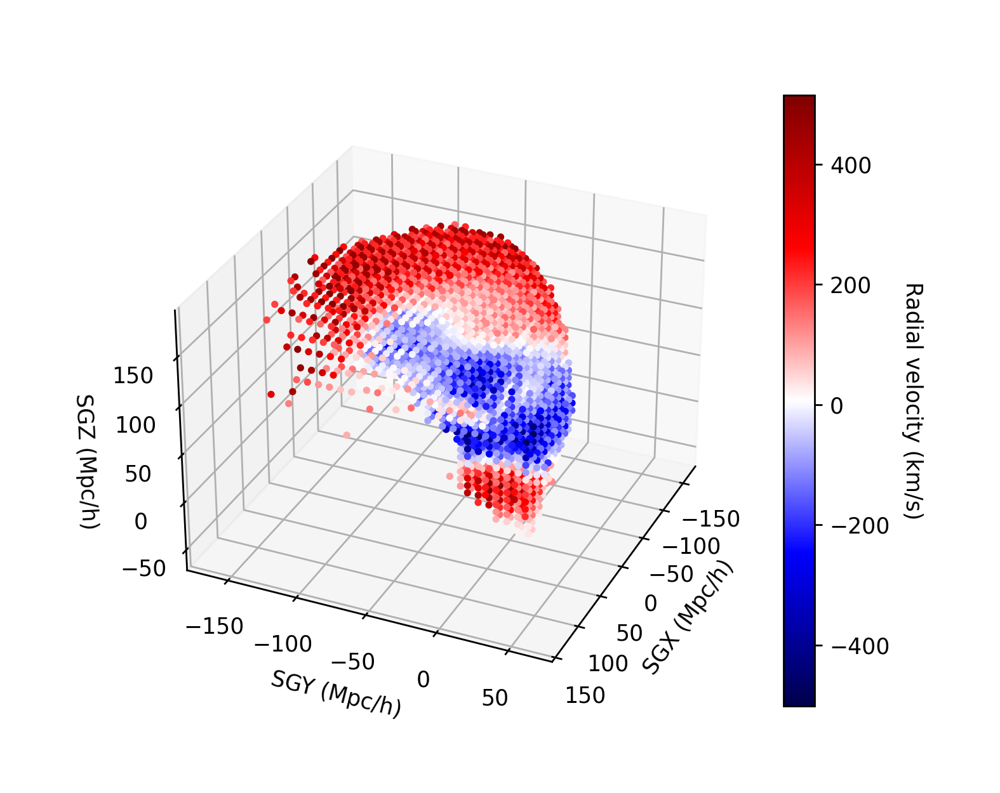

In [19]:
fig = plt.figure(figsize=(6.3,5.0))
ax = fig.add_subplot(111, projection='3d')
velmap=ax.scatter(lania_in.sgx,lania_in.sgy,lania_in.sgz,s=5,alpha=1,c=lania_rad_vel,cmap=plt.cm.seismic)
cbar01 = plt.colorbar(velmap)
cbar01.set_label('Radial velocity (km/s)', rotation=270,labelpad=15)
plt.axis('equal')
plt.show()
plt.xlabel("SGX (Mpc/h)")
plt.ylabel("SGY (Mpc/h)")
ax.set_zlabel("SGZ (Mpc/h)")
ax.view_init(elev=30, azim=24)
plt.xlim(-175.,150.)
plt.ylim(-175.,75.)
plt.savefig('Lania_rad_vel.png', dpi=300)
plt.show()

In [20]:
datplot={'SGX (Mpc/h)': lania_in.sgx,'SGY (Mpc/h)': lania_in.sgy,'SGZ (Mpc/h)': lania_in.sgz, 'Radial velocity (km/s)': lania_rad_vel}
# Plot_lania_data=pd.DataFrame(np.array((lania_in.sgx,lania_in.sgy,lania_in.sgz,lania_rad_vel)),columns=['SGX  Mpc/h','SGY  Mpc/h','SGZ  Mpc/h', 'Radial Velocity km/s'])
Plot_lania_data=pd.DataFrame(datplot)
import matplotlib.tri as mtri
import plotly.express as px

fig=px.scatter_3d(Plot_lania_data,x='SGX (Mpc/h)',y='SGY (Mpc/h)',z='SGZ (Mpc/h)',color='Radial velocity (km/s)',color_continuous_scale=px.colors.sequential.RdBu_r)
fig.update_layout(coloraxis_colorbar_title_text = 'Radial velocity (km/s)')
fig.update_traces(marker=dict(size=5),
                  selector=dict(mode='markers'))
fig.show()
### EXPORT TO HTML
# Please, execute `help(fig.write_html)` to learn about all the
# available keyword arguments to control the output
fig.write_html("Lania_rad_v_data.html", include_plotlyjs=True, full_html=True)

<IPython.core.display.Javascript object>


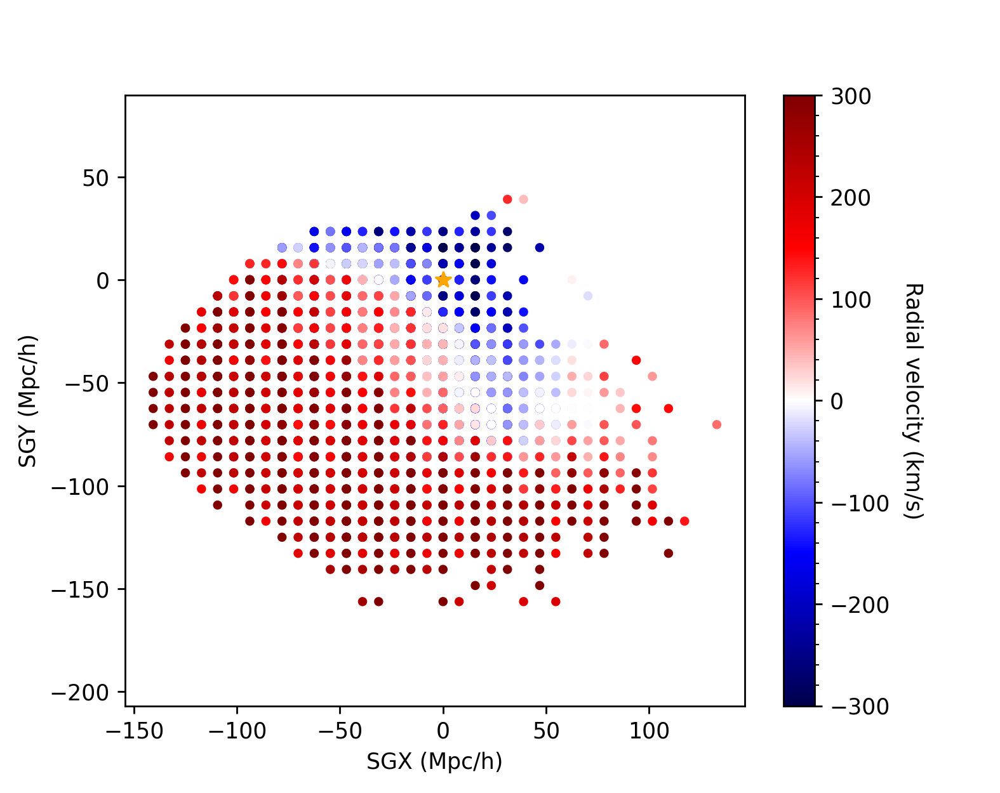

In [21]:
#Z projection

fig = plt.figure(figsize=(6.3,5.0))
ax = fig.add_subplot(111)
ax.set_xlim(-175.,150.)
ax.set_ylim(-175.,75.)
# ax.set_zlim(-100.,250.)

#Plot Laniakea's surface
d01 = ax.scatter(lania_in.sgx,lania_in.sgy,c=lania_rad_vel,cmap=plt.cm.seismic,s=10,alpha=1,vmax=300,vmin=-300)
cbar01 = plt.colorbar(d01)
cbar01.set_label('Radial velocity (km/s)', rotation=270,labelpad=15)
cbar01.ax.minorticks_on()
#Plot MW
ax.scatter(0,0,color="orange",marker='*',s=50)
plt.axis('equal')
plt.xlabel("SGX (Mpc/h)")
plt.ylabel("SGY (Mpc/h)")
plt.savefig('Z_projection_rvel.png', dpi=300)
plt.show()

<IPython.core.display.Javascript object>


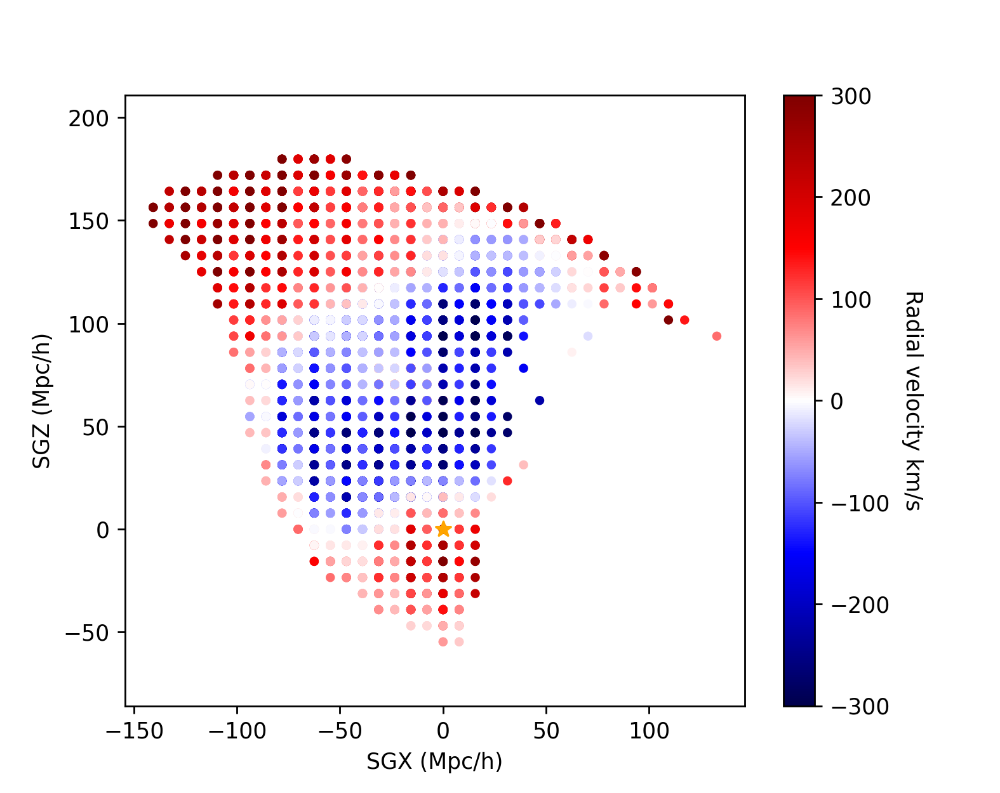

In [22]:
#Y projection

fig = plt.figure(figsize=(6.3,5.0))
ax = fig.add_subplot(111)
#Plot Laniakea's surface
d01 = ax.scatter(lania_in.sgx,lania_in.sgz,c=lania_rad_vel,cmap=plt.cm.seismic,s=10,alpha=1,vmax=300,vmin=-300)
cbar01 = plt.colorbar(d01)
cbar01.set_label('Radial velocity km/s', rotation=270,labelpad=15)
# ax.plot(x, y, color='gold', alpha=0.1)

#Plot MW
ax.scatter(0,0,color="orange",marker='*',s=50)
plt.axis('equal')
plt.xlabel("SGX (Mpc/h)")
plt.ylabel("SGZ (Mpc/h)")
plt.savefig('Y_projection_rvel.png', dpi=300)
plt.show()

<IPython.core.display.Javascript object>


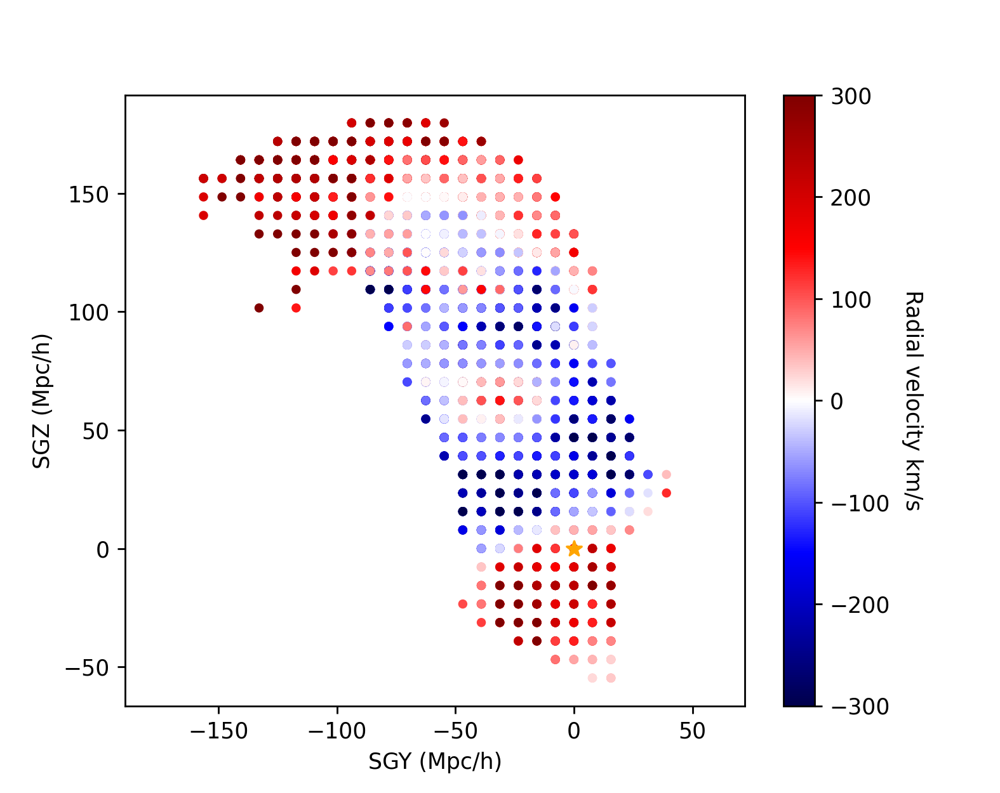

In [23]:
#X projection

fig = plt.figure(figsize=(6.3,5.0))
ax = fig.add_subplot(111)

#Plot Laniakea's surface
d01 = ax.scatter(lania_in.sgy,lania_in.sgz,c=lania_rad_vel,cmap=plt.cm.seismic,s=10,alpha=1,vmax=300,vmin=-300)
cbar01 = plt.colorbar(d01)
cbar01.set_label('Radial velocity km/s', rotation=270,labelpad=15)
# ax.plot(x, y, color='gold', alpha=0.1)

#Plot MW
ax.scatter(0,0,color="orange",marker='*',s=50)
plt.axis('equal')
plt.xlabel("SGY (Mpc/h)")
plt.ylabel("SGZ (Mpc/h)")
plt.savefig('X_projection_rvel.png', dpi=300)
plt.show()

Fits the radial velocity field with the triaxial model: to begin with we define the Likelihood

In [24]:
from scipy.optimize import minimize
from scipy.optimize import basinhopping

# Compute all vertices first before fitting

vert = np.empty((len(coords[:,0]), 8, 3))
for i in range(len(coords)):
    vert[i] = vertices(coords[i,0],coords[i,1],coords[i,2])
    
#vert[i] is 8 x 3 coordinates of the vertices for coord[i]

def recvelBIsmoothlike(vert,_xc,_yc,_zc,Ha,Hb,Hc):

    centre = np.array([_xc,_yc,_zc])
    rotated_vert = np.einsum('lvi,ij->lvj', vert-centre[None,None,:],R.T)   # Has shape (len(coords[:,0],8,3))
    rotated_dist = np.sqrt(np.sum((vert-centre[None,None,:])**2, axis=-1))  # Has shape (len(coords[:,0],8))
    BIrvel = (Ha*rotated_vert[:,:,0]**2 + Hb*rotated_vert[:,:,1]**2 + Hc*rotated_vert[:,:,2]**2) / (rotated_dist+0.0000000001)
    return (1/8)*np.sum(BIrvel, axis=-1)   # Returns an array of shape (len(coords[:,0]))

def smlog_likelihood(Hi):
    Ha,Hb,Hc = Hi
    smmodel=recvelBIsmoothlike(vert,0,0,0,Ha,Hb,Hc)
    return -0.5*np.sum((lania_rad_vel - smmodel)**2 /errorsinlan**2)

#Compute the best fit for the above Likelihood        
start = np.array([0,0,0])
result = basinhopping(
    lambda *args: -smlog_likelihood(*args),
    start,
    niter_success=10,
    niter=100,
    stepsize=0.005,
    minimizer_kwargs={
        "method": "Nelder-Mead",
        "tol": 1.0e-4,
        "options": {"maxiter": 40000, "xatol": 1.0e-4, "fatol": 1.0e-4},
        },
)
print("#-------------- Best-fit----------------")
print(result)
bestfit=result.x
print(bestfit)

def log_prior(Hi):
    Hi
    if -6.0 < Hi[0] < 6 and -6.0 < Hi[0] < 6.0 and -6.0 < Hi[2] < 6.0:
        return 0.0
    return -np.inf

def log_probability(Hi):
    lp = log_prior(Hi)
    if not np.isfinite(lp):
        return -np.inf
    return lp + log_likelihood(Hi)


#-------------- Best-fit----------------
                    message: ['success condition satisfied']
                    success: True
                        fun: 2010.7790939937329
                          x: [-3.400e+00 -6.450e-01  6.890e-01]
                        nit: 15
      minimization_failures: 0
                       nfev: 1522
 lowest_optimization_result:       message: Optimization terminated successfully.
                                   success: True
                                    status: 0
                                       fun: 2010.7790939937329
                                         x: [-3.400e+00 -6.450e-01
                                              6.890e-01]
                                       nit: 40
                                      nfev: 76
                             final_simplex: (array([[-3.400e+00,
                                                    -6.450e-01,
                                                     6.890e-01],
   

Now we perform a MCMC parameter exploration to find the best fit for Ha, Hb and Hc

 22%|████████████▊                                             | 4400/20000 [04:18<15:18, 16.99it/s]


<IPython.core.display.Javascript object>


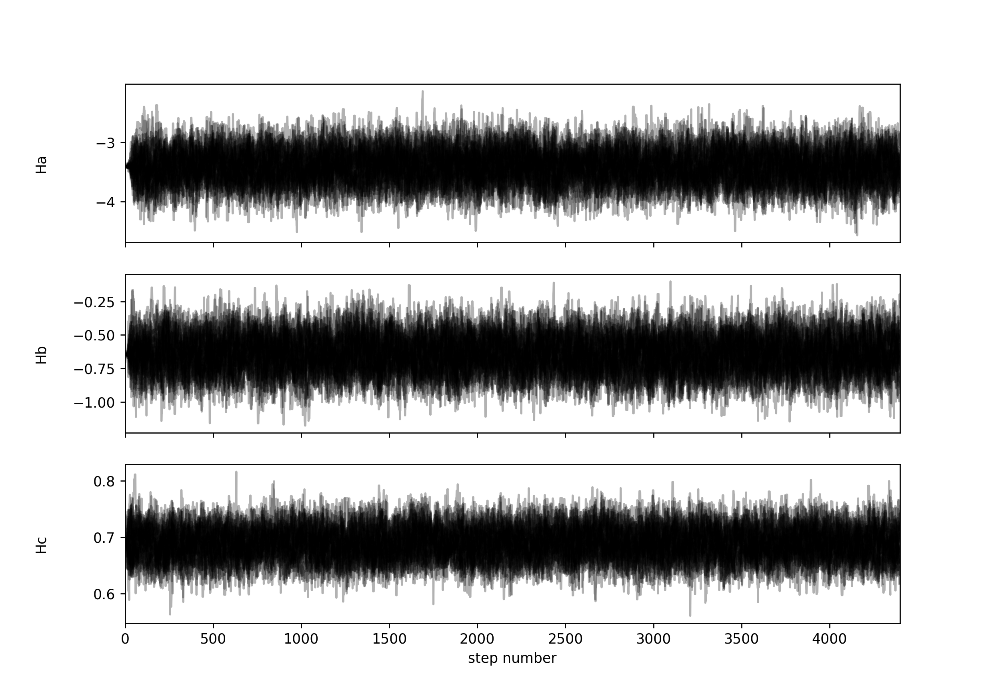

(9152, 3)


<IPython.core.display.Javascript object>


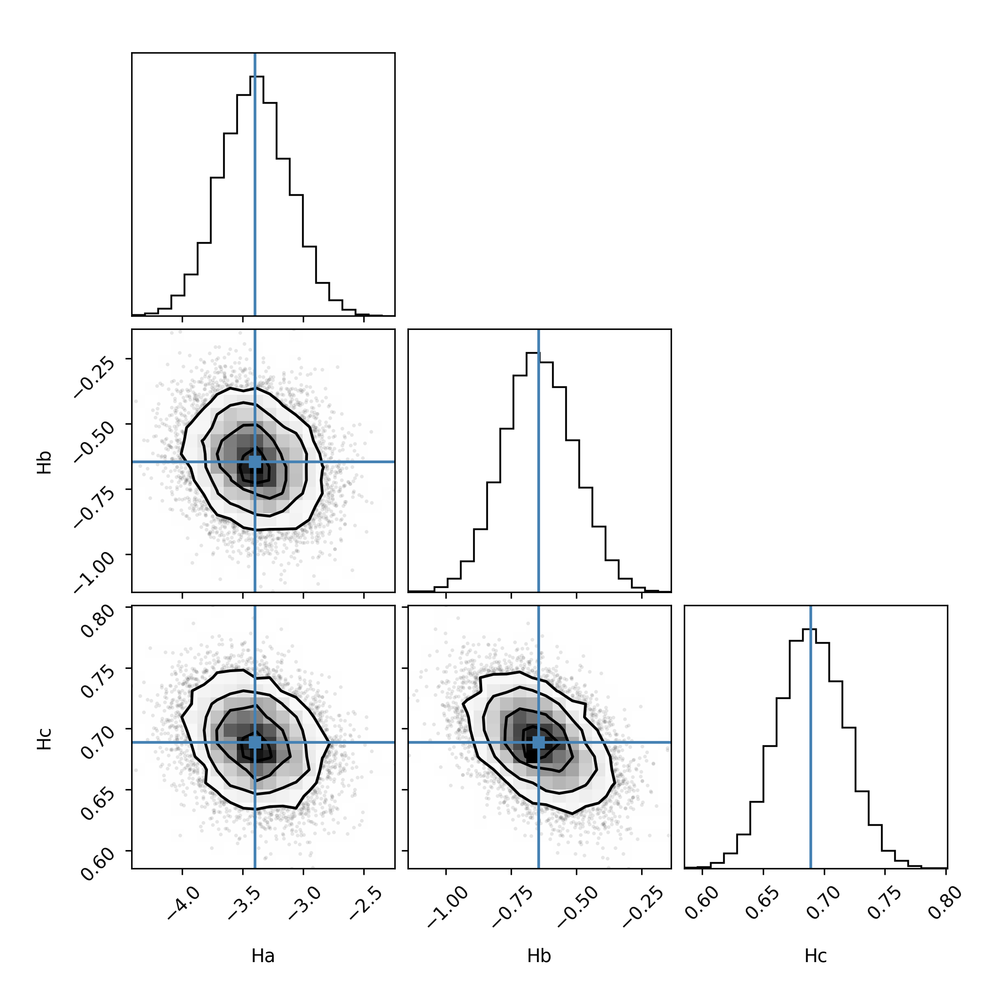

In [25]:
#Now we define prior and posterior for the MCMC analysis
import emcee

def log_prior(Hi):
    Hi
    if -6.0 < Hi[0] < 6 and -6.0 < Hi[1] < 6.0 and -6.0 < Hi[2] < 6.0:
        return 0.0
    return -np.inf

def smlog_probability(Hi):
    lp = log_prior(Hi)
    if not np.isfinite(lp):
        return -np.inf
    return lp + smlog_likelihood(Hi)

pos = bestfit + 1e-4 * np.random.randn(32, 3)
nwalkers, ndim = pos.shape
sampler = emcee.EnsembleSampler(
    nwalkers, ndim, smlog_probability
)

# sampler.run_mcmc(pos, 5000, progress=True);

max_n = 20000

# We'll track how the average autocorrelation time estimate changes
index = 0
autocorr = np.empty(max_n)

# This will be useful to testing convergence
old_tau = np.inf

#Now, we’ll run the chain for up to 10,000 steps and check the 
#autocorrelation time every 100 steps. If the chain is longer 
#than 100 times the estimated autocorrelation time and 
#if this estimate changed by less than 1%, we’ll consider things 
#converged.

# Now we'll sample for up to max_n steps
for sample in sampler.sample(pos, iterations=max_n, progress=True):
    # Only check convergence every 100 steps
    if sampler.iteration % 100:
        continue

    # Compute the autocorrelation time so far
    # Using tol=0 means that we'll always get an estimate even
    # if it isn't trustworthy
    tau = sampler.get_autocorr_time(tol=0)
    autocorr[index] = np.mean(tau)
    index += 1

    # Check convergence
    converged = np.all(tau * 100 < sampler.iteration)
    converged &= np.all(np.abs(old_tau - tau) / tau < 0.01)
    if converged:
        break
    old_tau = tau

#show the samplers
fig, axes = plt.subplots(3, figsize=(10, 7), sharex=True)
samples = sampler.get_chain()
labels = ["Ha", "Hb", "Hc"]
for i in range(ndim):
    ax = axes[i]
    ax.plot(samples[:, :, i], "k", alpha=0.3)
    ax.set_xlim(0, len(samples))
    ax.set_ylabel(labels[i])
    ax.yaxis.set_label_coords(-0.1, 0.5)

axes[-1].set_xlabel("step number");
#discards the firsts
flat_samples = sampler.get_chain(discard=100, thin=15, flat=True)
print(flat_samples.shape)

#draws cornerplot
import corner

fig = corner.corner(
    flat_samples, labels=labels, truths=bestfit
);

In [26]:
#percentile error bars
from IPython.display import display, Math
errorbarsup=[]
errorbarsdown=[]
for i in range(ndim):
    mcmc = np.percentile(flat_samples[:, i], [16, 50, 84])
    q = np.diff(mcmc)
    txt = "\mathrm{{{3}}} = {0:.3f}_{{-{1:.3f}}}^{{{2:.3f}}}"
    txt = txt.format(mcmc[1], q[0], q[1], labels[i])
    display(Math(txt))
    errorbarsup.append(q[1])
    errorbarsdown.append(-q[0])

gaussianerr=np.round((np.array(errorbarsup) -np.array(errorbarsdown))/2,3)

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

Saves the theoretical prediction of our model and the residuals with the reconstructed velocities

In [27]:
theory_radvel_in_MCMC = recvelBIsmoothlike(vert,sgx_c,sgy_c,sgz_c,bestfit[0],bestfit[1],bestfit[2])

theory_err_radvel_in_MCMC=np.zeros(len(coords))
for i in range(len(coords)):
    theory_err_radvel_in_MCMC[i]=(err_recvelBI(coords[i][0],coords[i][1],coords[i][2],sgx_c,sgy_c,sgz_c,gaussianerr[0],gaussianerr[1],gaussianerr[2]))
    
residuals_MCMC=[]
for i in range(len(coords)):
    residuals_MCMC.append(float((lania_rad_vel[i]-theory_radvel_in_MCMC[i])/(np.sqrt((theory_err_radvel_in_MCMC[i])**2 +(err_radvel_in_nc[i])**2))))
    

Plots a histogram of the residuals and compare with a Gaussian distribution

<IPython.core.display.Javascript object>


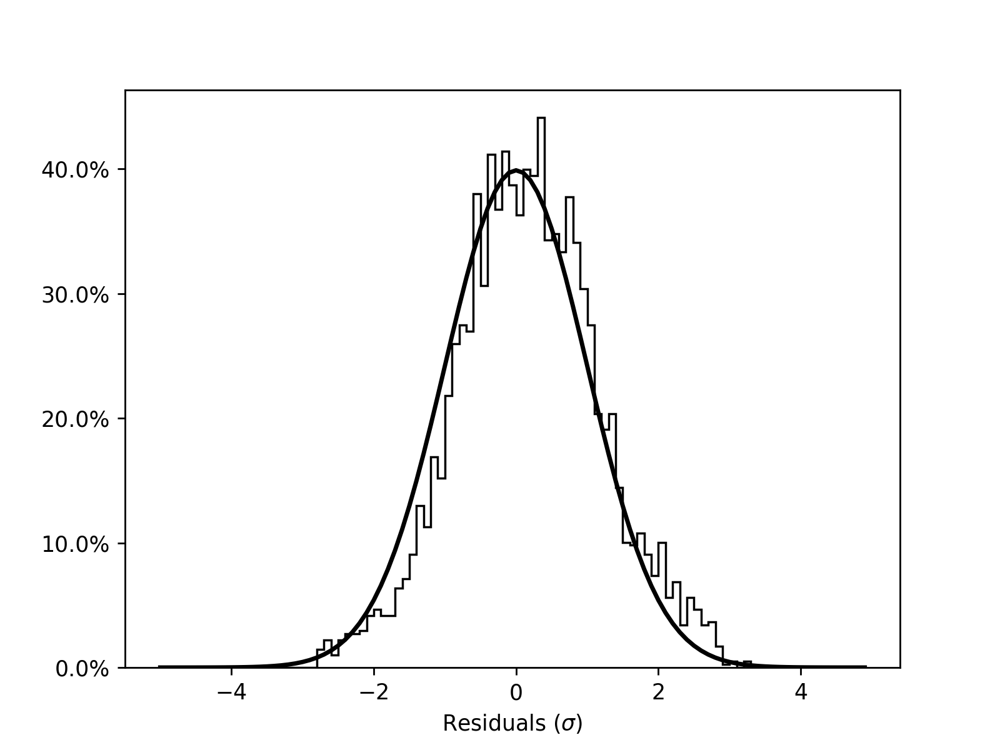

In [28]:
from scipy.stats import norm
import matplotlib.ticker as mtick
from matplotlib.ticker import PercentFormatter
fig = plt.figure()
events_prop, edges_prop, patches_prop = plt.hist(residuals_MCMC,bins=np.arange(-5.0,5.0,0.1),density=1,histtype='step',color='black')#,label=‘Normalized uncorrected $P(r)$’)#
_yyy = norm.pdf(edges_prop, 0.0, 1.0)
l = plt.plot(edges_prop, _yyy, 'k', linewidth=2)#label=‘Gaussian with mean 0 and $\sigma$ 1’)#,label=‘Gaussian fit to the uncorrected $P(r)$’)
plt.xlabel("Residuals ($\sigma$)")
# plt.ylabel("Percentage of cells")
plt.gca().yaxis.set_major_formatter(PercentFormatter(1))
plt.savefig('histogram_residuals.png', dpi=300)

Plotting the spatial distribution of the residuals on the map and its projection along orthogonal planes in0 the supergalactic Cartesian frame

<IPython.core.display.Javascript object>


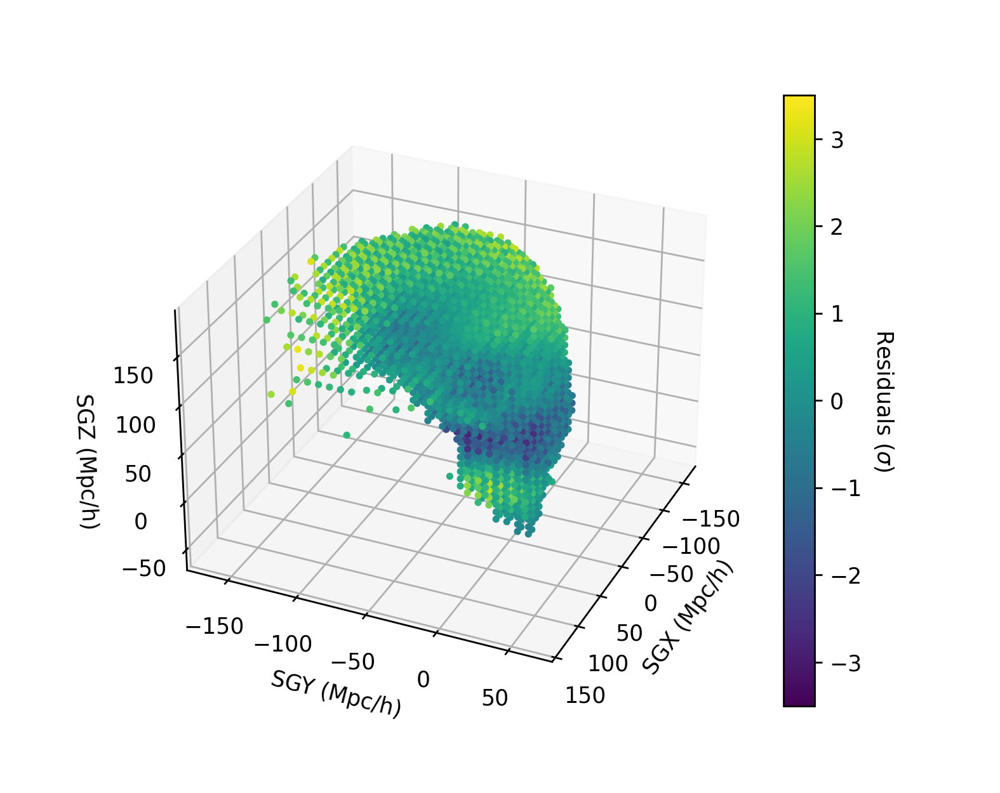

In [29]:
fig = plt.figure(figsize=(6.3,5.0))
ax = fig.add_subplot(111, projection='3d')
velmap=ax.scatter(lania_in.sgx,lania_in.sgy,lania_in.sgz,s=5,alpha=1,c=(lania_rad_vel - theory_radvel_in_MCMC)/(np.sqrt((theory_err_radvel_in_MCMC[i])**2 +(err_radvel_in_nc[i])**2)),cmap=plt.cm.viridis, vmax=3.5,vmin=-3.5)
cbar01 = plt.colorbar(velmap)
cbar01.set_label('Residuals ($\sigma$)', rotation=270,labelpad=15)
# ax.scatter(lania_in.sgx,lania_in.sgy,lania_in.sgz,s=5,alpha=1,color='green')
# ax.scatter(lania_surf_cf4.SGX,lania_surf_cf4.SGY,lania_surf_cf4.SGZ,s=5,alpha=0.05,color='red')
plt.axis('equal')
plt.show()
plt.xlabel("SGX (Mpc/h)")
plt.ylabel("SGY (Mpc/h)")
ax.set_zlabel("SGZ (Mpc/h)")
ax.view_init(elev=30, azim=24)
plt.xlim(-175.,150.)
plt.ylim(-175.,75.)
plt.savefig('Lania_residuals.png', dpi=300)
plt.show()

<IPython.core.display.Javascript object>


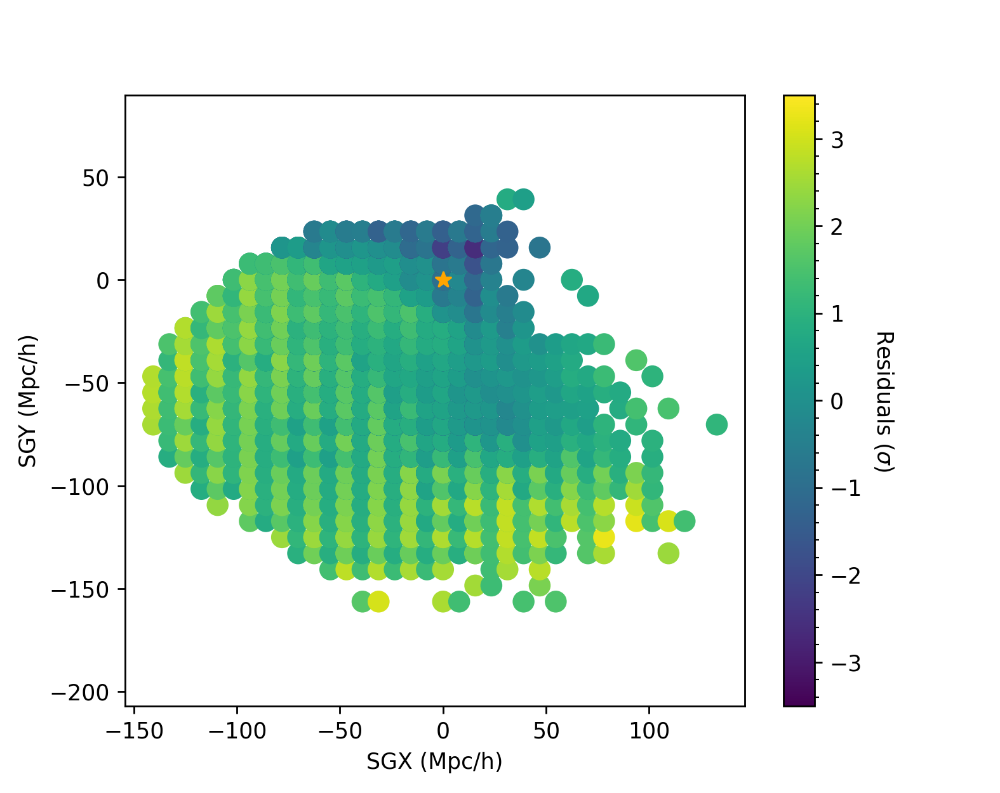

In [30]:
#Z projection

fig = plt.figure(figsize=(6.3,5.0))
ax = fig.add_subplot(111)
ax.set_xlim(-175.,150.)
ax.set_ylim(-175.,75.)
# ax.set_zlim(-100.,250.)

#Plot Laniakea's surface
d01 = ax.scatter(lania_in.sgx,lania_in.sgy,c=((lania_rad_vel - theory_radvel_in_MCMC)/(np.sqrt((theory_err_radvel_in_MCMC[i])**2 +(err_radvel_in_nc[i])**2))),cmap=plt.cm.viridis,alpha=1,vmax=3.5,vmin=-3.5,s=80)
cbar01 = plt.colorbar(d01)
cbar01.set_label('Residuals ($\sigma$)', rotation=270,labelpad=15)
cbar01.ax.minorticks_on()
#Plot MW
ax.scatter(0,0,color="orange",marker='*',s=50)
plt.axis('equal')
plt.xlabel("SGX (Mpc/h)")
plt.ylabel("SGY (Mpc/h)")
plt.savefig('Z_projection_residuals.png', dpi=300)
plt.show()

<IPython.core.display.Javascript object>


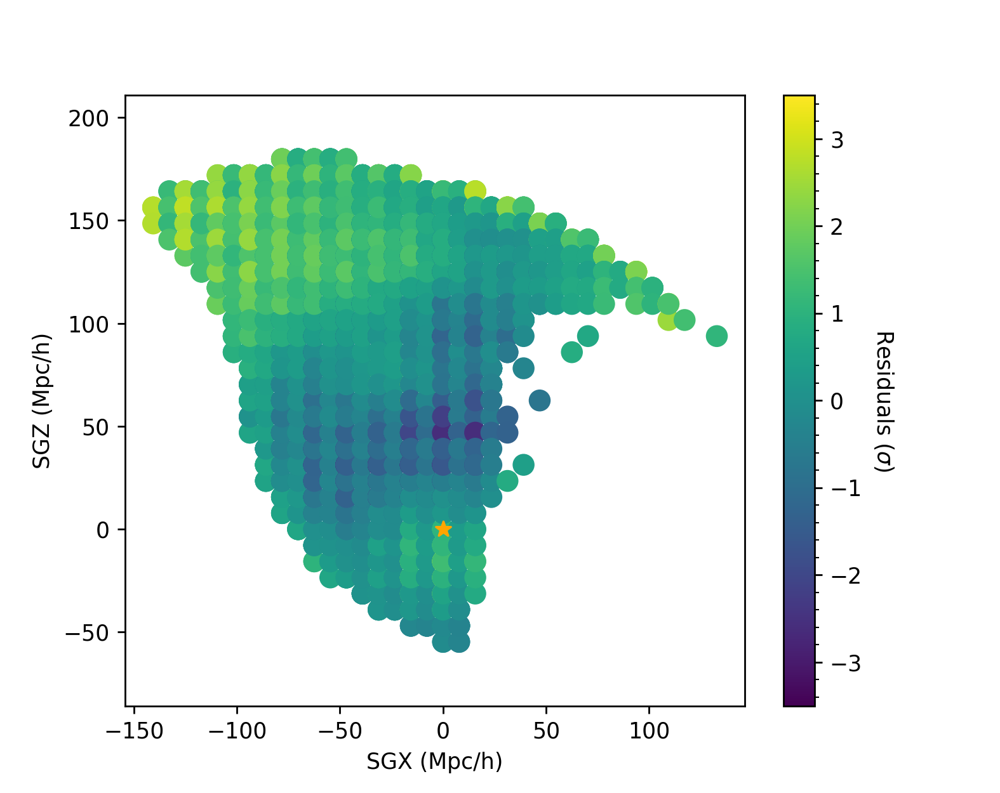

In [31]:
#Y projection

fig = plt.figure(figsize=(6.3,5.0))
ax = fig.add_subplot(111)
# ax.set_zlim(-100.,250.)

#Plot Laniakea's surface
d01 = ax.scatter(lania_in.sgx,lania_in.sgz,c=((lania_rad_vel - theory_radvel_in_MCMC)/(np.sqrt((theory_err_radvel_in_MCMC[i])**2 +(err_radvel_in_nc[i])**2))),cmap=plt.cm.viridis,alpha=1,vmax=3.5,vmin=-3.5,s=80)
cbar01 = plt.colorbar(d01)
cbar01.set_label('Residuals ($\sigma$)', rotation=270,labelpad=15)
cbar01.ax.minorticks_on()
#Plot MW
ax.scatter(0,0,color="orange",marker='*',s=50)
plt.axis('equal')
plt.xlabel("SGX (Mpc/h)")
plt.ylabel("SGZ (Mpc/h)")
plt.savefig('Y_projection_residuals.png', dpi=300)
plt.show()

<IPython.core.display.Javascript object>


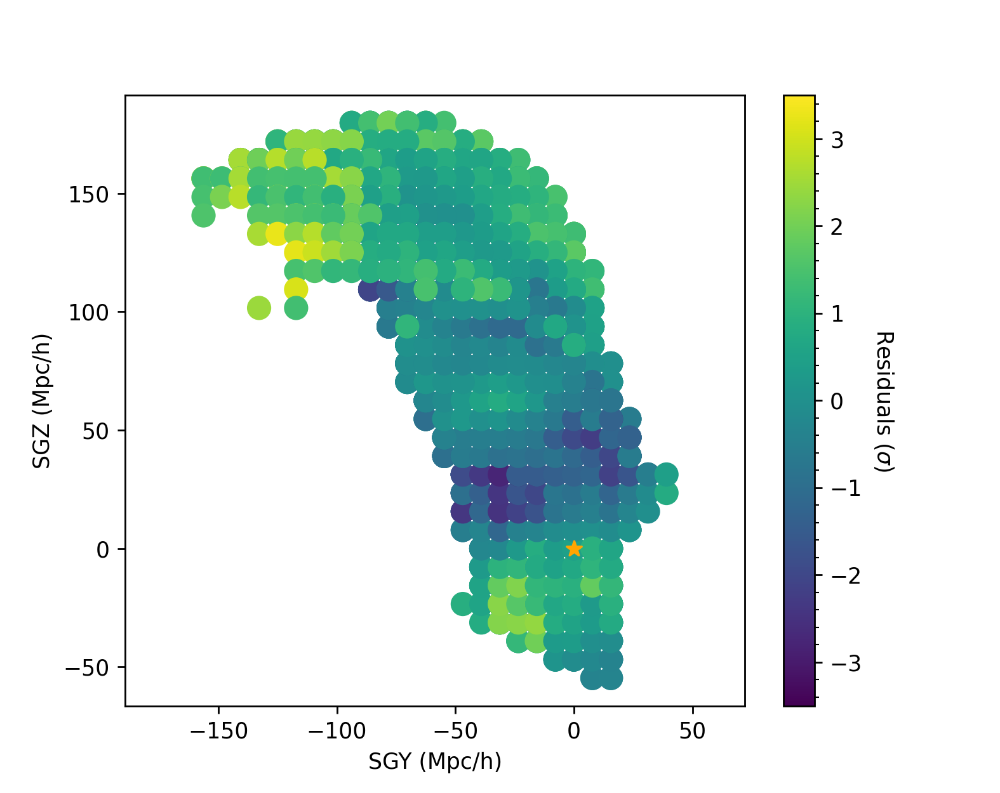

In [32]:
#X projection

fig = plt.figure(figsize=(6.3,5.0))
ax = fig.add_subplot(111)
# ax.set_zlim(-100.,250.)

#Plot Laniakea's surface
d01 = ax.scatter(lania_in.sgy,lania_in.sgz,c=((lania_rad_vel - theory_radvel_in_MCMC)/(np.sqrt((theory_err_radvel_in_MCMC[i])**2 +(err_radvel_in_nc[i])**2))),cmap=plt.cm.viridis,alpha=1,vmax=3.5,vmin=-3.5,s=100)
cbar01 = plt.colorbar(d01)
cbar01.set_label('Residuals ($\sigma$)', rotation=270,labelpad=15)
cbar01.ax.minorticks_on()
#Plot MW
ax.scatter(0,0,color="orange",marker='*',s=50)
plt.axis('equal')
plt.xlabel("SGY (Mpc/h)")
plt.ylabel("SGZ (Mpc/h)")
plt.savefig('X_projection_residuals.png', dpi=300)
plt.show()

In [33]:
resplot={'SGX (Mpc/h)': lania_in.sgx,'SGY (Mpc/h)': lania_in.sgy,'SGZ (Mpc/h)': lania_in.sgz, 'Residuals ($\sigma$)': (lania_rad_vel - theory_radvel_in_MCMC)/(np.sqrt((theory_err_radvel_in_MCMC[i])**2 +(err_radvel_in_nc[i])**2))}
# Plot_lania_data=pd.DataFrame(np.array((lania_in.sgx,lania_in.sgy,lania_in.sgz,lania_rad_vel)),columns=['SGX  Mpc/h','SGY  Mpc/h','SGZ  Mpc/h', 'Radial Velocity km/s'])
Plot_lania_residuals=pd.DataFrame(resplot)
import matplotlib.tri as mtri
import plotly.express as px

fig=px.scatter_3d(Plot_lania_residuals,x='SGX (Mpc/h)',y='SGY (Mpc/h)',z='SGZ (Mpc/h)',color='Residuals ($\sigma$)',color_continuous_scale=px.colors.sequential.Viridis,range_color=(-3,3))
fig.update_layout(coloraxis_colorbar_title_text = 'Residuals')
fig.update_traces(marker=dict(size=5),
                  selector=dict(mode='markers'))
fig.show()
### EXPORT TO HTML
# Please, execute `help(fig.write_html)` to learn about all the
# available keyword arguments to control the output
fig.write_html("Lania_residuals.html", include_plotlyjs=True, full_html=True)

Now we test the homogeneity inside Laniakea by randomly picking points in its interior and studying the distribution of the residuals between the radial velocities of the other cells with respect to these points and the theoretical prediction

In [34]:
import random
def Homogeneitytest(lll):  
    
    k=len(coords)
    randomresidual=[]
  
    for n in range(lll):
        ppp=random.choice(range(k))
        radvel_in_random=[]
        for i in range(len(coords)):
            radvel_in_random.append(lania_radial_velocity(coords[i][0],coords[i][1],coords[i][2],coords[ppp][0]+0.00001,coords[ppp][1]+0.00001,coords[ppp][2]+0.00001,True,False))

        theory_radvel_in_rand=recvelBIsmoothlike(vert,coords[ppp][0]+0.00001,coords[ppp][1]+0.00001,coords[ppp][2]+0.00001,bestfit[0],bestfit[1],bestfit[2])
           
        err_radvel_in_random=np.zeros(len(coords))
        for i in range(len(coords)):
            err_radvel_in_random[i]=(lania_rad_vel_err(coords[i][0],coords[i][1],coords[i][2],coords[ppp][0]+0.00001,coords[ppp][1]+0.00001,coords[ppp][2]+0.00001,False))
            
     
        randomresidual.append((radvel_in_random-theory_radvel_in_rand )/(np.sqrt((theory_err_radvel_in_MCMC)**2 +(err_radvel_in_random)**2)))      
    return randomresidual

residuals=Homogeneitytest(200)


Plots the results of the test

<IPython.core.display.Javascript object>


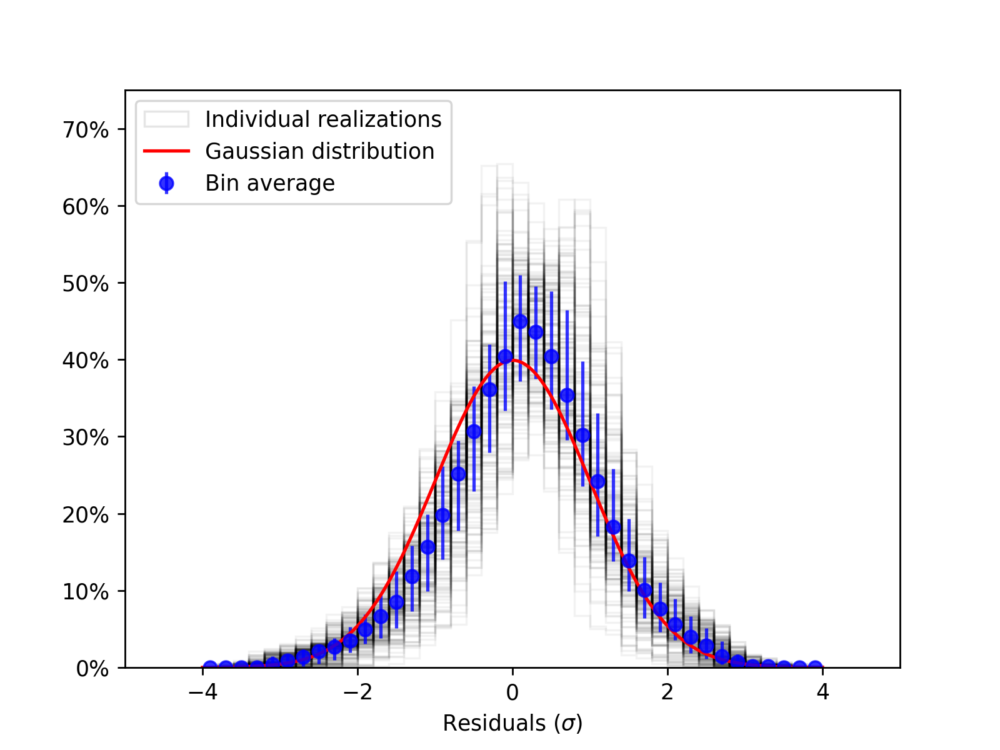

In [35]:
fig = plt.figure()
plt.xlim(-5,5)
plt.ylim(0,0.75)
nbins = 41
bins=np.linspace(-4,4,nbins)
xval=np.linspace(-4,4,500)
yvals=1.0/np.sqrt(2*np.pi)*np.exp(-0.5*xval**2)
my_hist = np.empty((nbins-1,len(residuals)))
for i in range(len(residuals)):
    my_hist[:,i] = np.histogram(residuals[i],bins=bins,density=1)[0]
    plt.hist(residuals[i],bins=bins,density=1,histtype='step',color='black',alpha=0.05)
my_quantiles = np.quantile(my_hist, [0.16, 0.50, 0.84], axis=1)
plt.hist(-100,histtype='step',color='black',alpha=0.1,label='Individual realizations')

# print(bins[:-1]+(bins[1:]+bins[:-1])/2.0)
plt.errorbar(bins[:-1]+(bins[1:]-bins[:-1])/2.0, my_quantiles[1], yerr=[my_quantiles[1]-my_quantiles[0],my_quantiles[2]-my_quantiles[1]],color='b',ls='None',marker='o',alpha=0.8,label='Bin average')
plt.plot(xval,yvals,color='red',label='Gaussian distribution')

plt.xlabel("Residuals ($\sigma$)")
# plt.ylabel("Percentage of cells")
plt.legend()
plt.show()
plt.gca().yaxis.set_major_formatter(PercentFormatter(1))
plt.savefig('Homogeneity_test.png', dpi=300)

The following plots the theoretical prediction of our toy model for the radial peculiar velocity of cells inside Laniakea and its projections along orthogonal planes in the Supergalactic Cartesian frame

Plot of the predicted velocity inside Laniakea from MCMC


<IPython.core.display.Javascript object>


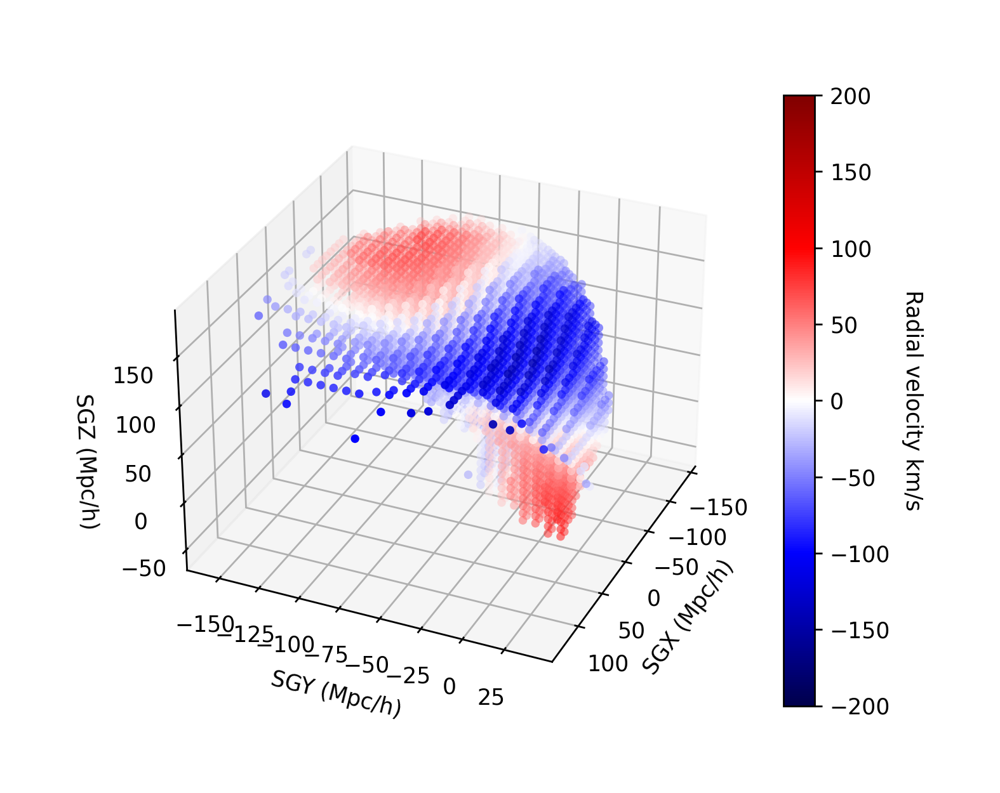

In [36]:
print('Plot of the predicted velocity inside Laniakea from MCMC')

fig = plt.figure(figsize=(6.3,5.0))
ax = fig.add_subplot(111, projection='3d')

velplot = ax.scatter(lania_in.sgx,lania_in.sgy,lania_in.sgz,c=theory_radvel_in_MCMC,edgecolor="none",s=15,cmap=plt.cm.seismic,vmin = -200, vmax =200)
cbar02 = plt.colorbar(velplot)
plt.xlabel("SGX (Mpc/h)")
plt.ylabel("SGY (Mpc/h)")
ax.set_zlabel("SGZ (Mpc/h)")
ax.view_init(elev=30, azim=24)
cbar02.set_label('Radial velocity km/s', rotation=270,labelpad=15)
plt.savefig('Radial_velocity_Laniakea_th.png', dpi=300)
plt.show()

In [37]:
Thplot={'SGX (Mpc/h)': lania_in.sgx,'SGY (Mpc/h)': lania_in.sgy,'SGZ (Mpc/h)': lania_in.sgz, 'Radial velocity (km/s)': theory_radvel_in_MCMC}
# Plot_lania_data=pd.DataFrame(np.array((lania_in.sgx,lania_in.sgy,lania_in.sgz,lania_rad_vel)),columns=['SGX  Mpc/h','SGY  Mpc/h','SGZ  Mpc/h', 'Radial Velocity km/s'])
Plot_lania_Th=pd.DataFrame(Thplot)

fig=px.scatter_3d(Plot_lania_Th,x='SGX (Mpc/h)',y='SGY (Mpc/h)',z='SGZ (Mpc/h)',color='Radial velocity (km/s)',color_continuous_scale=px.colors.sequential.RdBu_r)
fig.update_layout(coloraxis_colorbar_title_text = 'Radial velocity (km/s)')
fig.update_traces(marker=dict(size=5),
                  selector=dict(mode='markers'))

fig.show()
### EXPORT TO HTML
# Please, execute `help(fig.write_html)` to learn about all the
# available keyword arguments to control the output
fig.write_html("Lania_rad_v_theory.html", include_plotlyjs=True, full_html=True)

<IPython.core.display.Javascript object>


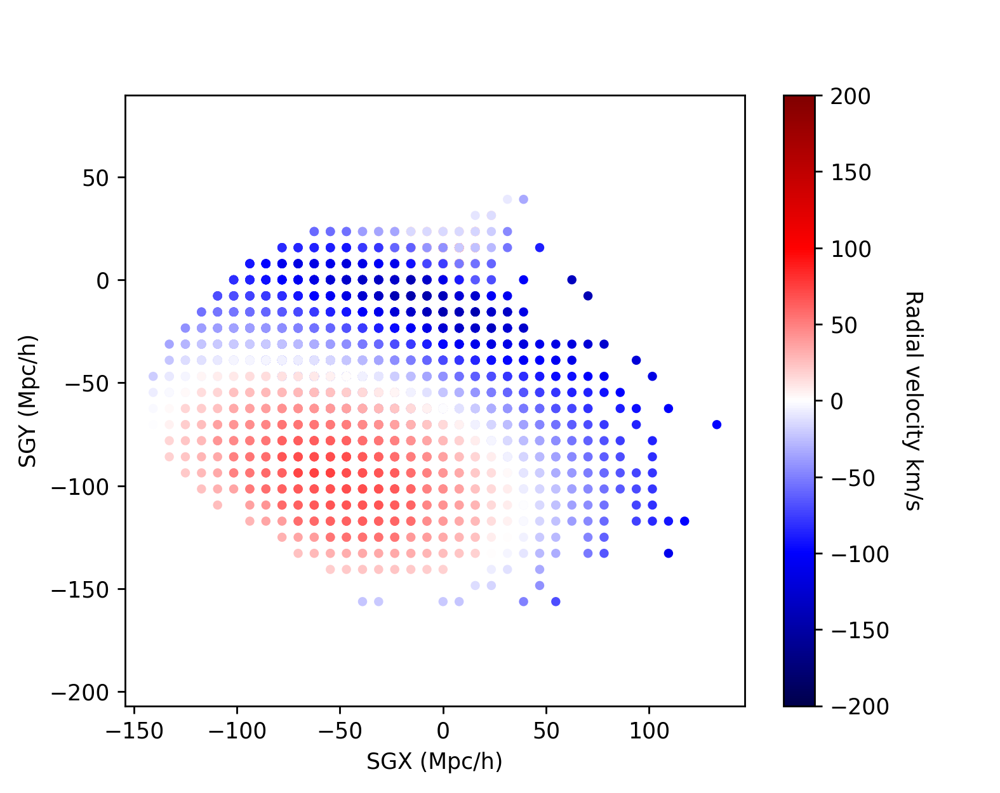

In [38]:
#Z projection

fig = plt.figure(figsize=(6.3,5.0))
ax = fig.add_subplot(111)
ax.set_xlim(-175.,150.)
ax.set_ylim(-175.,75.)
# ax.set_zlim(-100.,250.)

#Plot Laniakea's surface
d01 = ax.scatter(lania_in.sgx,lania_in.sgy,c=theory_radvel_in_MCMC,cmap=plt.cm.seismic,s=10,alpha=1,vmax=200,vmin=-200)
cbar01 = plt.colorbar(d01)
cbar01.set_label('Radial velocity km/s', rotation=270,labelpad=15)
# ax.plot(x, y, color='gold', alpha=0.1)

#Plot MW
# ax.scatter(0,0,color="orange",marker='*',s=50)
plt.axis('equal')
plt.xlabel("SGX (Mpc/h)")
plt.ylabel("SGY (Mpc/h)")
plt.savefig('Z_projection_th.png', dpi=300)
plt.show()



<IPython.core.display.Javascript object>


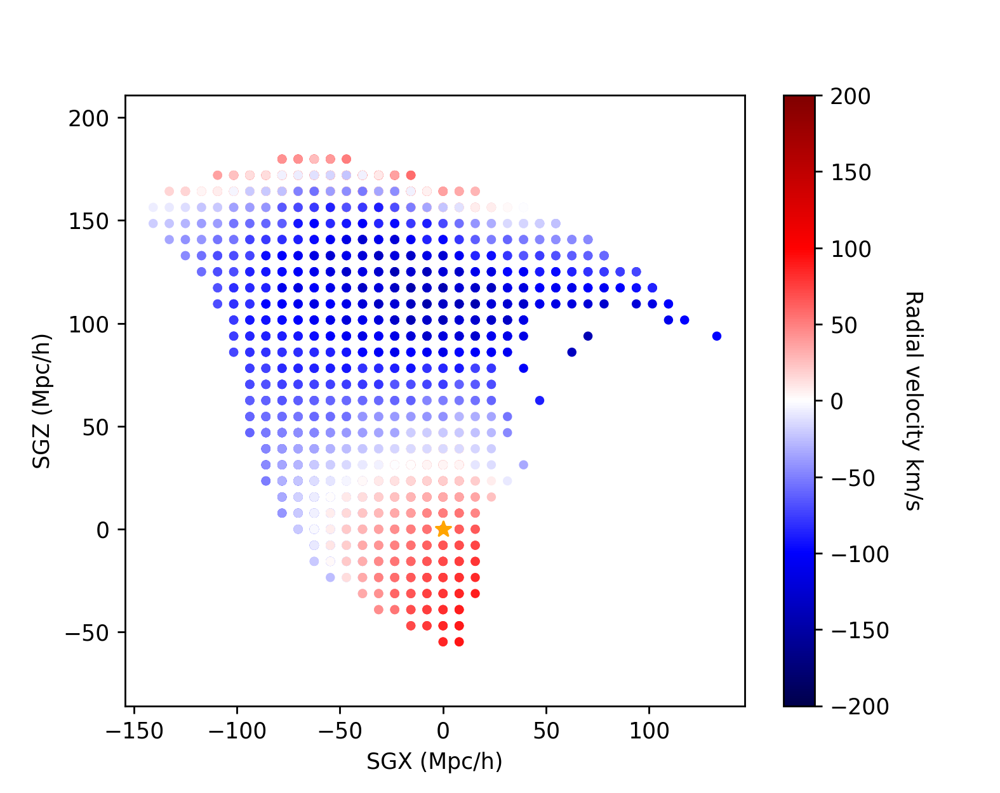

In [39]:
#Y projection

fig = plt.figure(figsize=(6.3,5.0))
ax = fig.add_subplot(111)
#Plot Laniakea's surface
d01 = ax.scatter(lania_in.sgx,lania_in.sgz,c=theory_radvel_in_MCMC,cmap=plt.cm.seismic,s=10,alpha=1,vmax=200,vmin=-200)
cbar01 = plt.colorbar(d01)
cbar01.set_label('Radial velocity km/s', rotation=270,labelpad=15)
# ax.plot(x, y, color='gold', alpha=0.1)

#Plot MW
ax.scatter(0,0,color="orange",marker='*',s=50)
plt.axis('equal')
plt.xlabel("SGX (Mpc/h)")
plt.ylabel("SGZ (Mpc/h)")
plt.savefig('Y_projection_th.png', dpi=300)
plt.show()

/var/folders/gm/yvqnp52d0dg0c6rgvbs833xh0000gp/T/ipykernel_26152/3955456803.py:3: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.



<IPython.core.display.Javascript object>


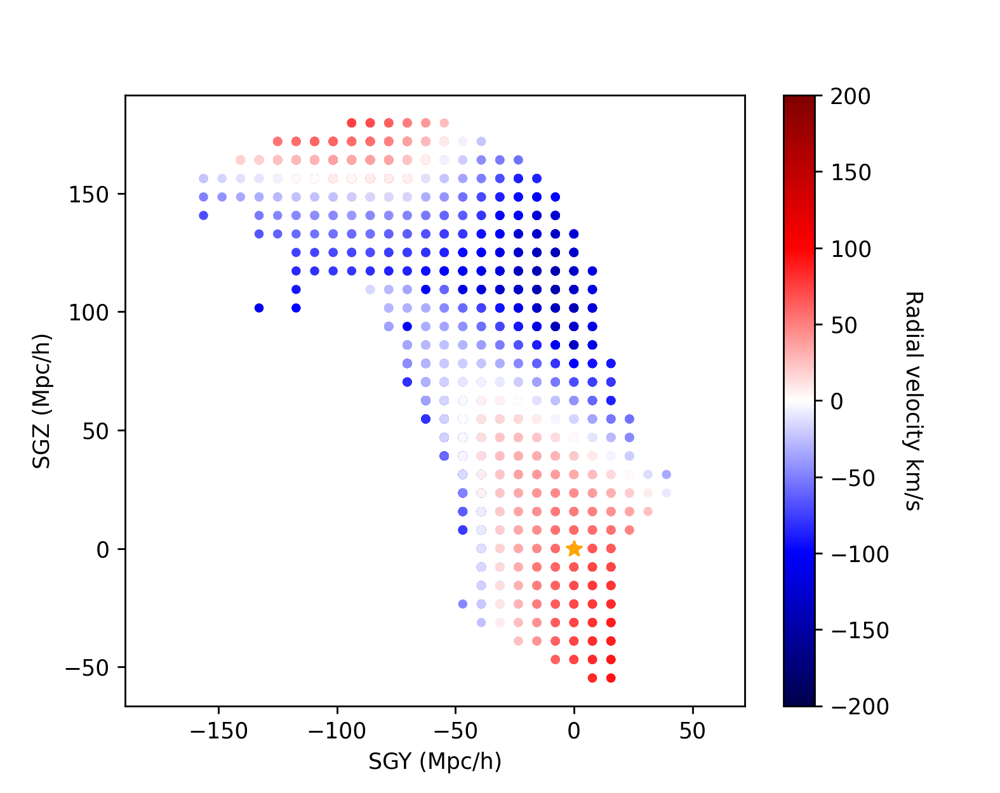

In [40]:
#X projection

fig = plt.figure(figsize=(6.3,5.0))
ax = fig.add_subplot(111)

#Plot Laniakea's surface
d01 = ax.scatter(lania_in.sgy,lania_in.sgz,c=theory_radvel_in_MCMC,cmap=plt.cm.seismic,s=10,alpha=1,vmax=200,vmin=-200)
cbar01 = plt.colorbar(d01)
cbar01.set_label('Radial velocity km/s', rotation=270,labelpad=15)
# ax.plot(x, y, color='gold', alpha=0.1)

#Plot MW
ax.scatter(0,0,color="orange",marker='*',s=50)
plt.axis('equal')
plt.xlabel("SGY (Mpc/h)")
plt.ylabel("SGZ (Mpc/h)")
plt.savefig('X_projection_th.png', dpi=300)
plt.show()

Now that we fitted our model we move on computing the corrections on the Luminosity distance that it predicts.

The following function finds the intersection point of the line of sight between any two points in the map (source and observer) and the surface of the ellipsoid, and return its distance to the observer. If the source is inside Laniakea just returns its distance

In [41]:
def interseeker(_xp,_yp,_zp,_xin,_yin,z_in,a,b,c):
    vs=np.dot([_xin-sgx_c,_yin-sgy_c,z_in-sgz_c],R.T)
    vend=np.dot([_xp-sgx_c,_yp-sgy_c,_zp-sgz_c],R.T)
    
    t1=( (b*c)**2*(-vend[0]*vs[0] +vs[0]**2) +(a*c)**2 *(-vend[1]*vs[1] +vs[1]**2) +(a*b)**2 *(-vend[2]*vs[2] +vs[2]**2)
      -(a*b*c) * np.sqrt( -c**2 *(vend[1]*vs[0] - vend[0]*vs[1])**2 +b**2 *(c**2 *(vend[0] - vs[0])**2 
      + a**2 *(vend[2] -vs[2])**2 -(vend[2]*vs[0] -vend[0]*vs[2])**2) + a**2 *(c**2 *(vend[1] -vs[1])**2 
      -(vend[2]*vs[1] -vend[1]*vs[2])**2)  )  )/( (a*c)**2 *(vend[1] -vs[1])**2 +b**2 *(c**2 *(vend[0]-vs[0])**2 +a**2 *(vend[2] -vs[2])**2))
    
    t2 = ( (b*c)**2*(-vend[0]*vs[0] +vs[0]**2) +(a*c)**2 *(-vend[1]*vs[1] +vs[1]**2) +(a*b)**2 *(-vend[2]*vs[2] +vs[2]**2)
      +(a*b*c) * np.sqrt( -c**2 *(vend[1]*vs[0] - vend[0]*vs[1])**2 +b**2 *(c**2 *(vend[0] - vs[0])**2 
      + a**2 *(vend[2] -vs[2])**2 -(vend[2]*vs[0] -vend[0]*vs[2])**2) + a**2 *(c**2 *(vend[1] -vs[1])**2 
      -(vend[2]*vs[1] -vend[1]*vs[2])**2)  )  )/( (a*c)**2 *(vend[1] -vs[1])**2 +b**2 *(c**2 *(vend[0]-vs[0])**2 +a**2 *(vend[2] -vs[2])**2))    

    t=np.array([t1,t2])
    p1=np.array([vs[0] +t[0]*(vend[0]-vs[0]),vs[1] +t[0]*(vend[1]-vs[1]),
                      vs[2] +t[0]*(vend[2]-vs[2])])
    rp1= np.array(np.dot([p1[0],p1[1],p1[2]],R) + [sgx_c,sgy_c,sgz_c])
    p2=np.array([vs[0] +t[1]*(vend[0]-vs[0]),vs[1] +t[1]*(vend[1]-vs[1]),
                      vs[2] +t[1]*(vend[2]-vs[2])])
    rp2= np.array(np.dot([p2[0],p2[1],p2[2]],R) + [sgx_c,sgy_c,sgz_c])
    case1=distancefromcenter(p1[0],p1[1],p1[2],vend[0],vend[1],vend[2])
    case2=distancefromcenter(p2[0],p2[1],p2[2],vend[0],vend[1],vend[2])
    if case1>case2:
        return rp2
    elif case2>case1:
        return rp1
    else:
        return rp1 

Computes the correction on the comoving (hence luminosity distance) predicted by the model

In [42]:
from scipy import interpolate
import scipy.integrate as integrate
# cosmo = FlatLambdaCDM(H0=75. * unit.km / unit.s / unit.Mpc, Om0=0.31)
redshifts=np.array(np.arange(0,2.3,0.001))
chis=cosmo.comoving_distance(redshifts)
ztochi = interpolate.interp1d(redshifts, chis,kind='cubic')
chitoz = interpolate.interp1d(chis,redshifts,kind='cubic')
def Hubble(_z):
    
    return cosmo.H(_z ).to_value()

def comovingdistancecorrection(Sg_p1,Sg_p2,_Ha,_Hb,_Hc):
            
    Rotp1= np.dot([Sg_p1[0]-Sg_p2[0],Sg_p1[1]-Sg_p2[1],Sg_p1[2]-Sg_p2[2]],R.T)

    Pinters=interseeker(Sg_p1[0],Sg_p1[1],Sg_p1[2],Sg_p2[0],Sg_p2[1],Sg_p2[2],Semiaxeslen[0],Semiaxeslen[1],Semiaxeslen[2])
   
    RotPinters=np.dot([Pinters[0],Pinters[1],Pinters[2]],R) + Sg_p2
  
    chiSN=distancefromcenter(Sg_p1[0],Sg_p1[1],Sg_p1[2],Sg_p2[0],Sg_p2[1],Sg_p2[2])
    rednova=chitoz(distancefromcenter(Sg_p1[0],Sg_p1[1],Sg_p1[2],Sg_p2[0],Sg_p2[1],Sg_p2[2]))
  
    chiBL=distancefromcenter(RotPinters[0],RotPinters[1],RotPinters[2],Sg_p2[0],Sg_p2[1],Sg_p2[2])
    redBL=chitoz(chiBL)
    
    
    def InverseHubbleFLRW(z):
        hubbfl = 1./Hubble(z)
        return hubbfl
        
    def InverseHubblerateB1(z):
        hubbdiri = 1./ (RotPinters[0]**2 * (Hubble(z)+_Ha)/(chiBL)**2 +(RotPinters[1]**2 * (Hubble(z)+_Hb))/(chiBL)**2 +(RotPinters[2]**2 *(Hubble(z)+_Hc))/(chiBL)**2)
        return hubbdiri
    
    def InverseHubblerateB1Inside(z):
        hubbdirinside = 1./ (Rotp1[0]**2 * (Hubble(z)+_Ha)/(chiSN)**2 +(Rotp1[1]**2 * (Hubble(z)+_Hb))/(chiSN)**2 +(Rotp1[2]**2 *(Hubble(z)+_Hc))/(chiSN)**2)
        return hubbdirinside
    
    if chiSN>chiBL:
#         print('case A')
        chiBI = integrate.quad(InverseHubblerateB1,0,redBL) 
        chiFLRW=integrate.quad(InverseHubbleFLRW,0,redBL)    
        return c*(chiBI[0] -chiFLRW[0])/chiSN
    else: 
#         chiSN<=chiBL:    
#         print('case B')
        chiBIin = integrate.quad(InverseHubblerateB1Inside,0,rednova)
        chiFLRWin = integrate.quad(InverseHubbleFLRW,0,rednova)
        c*(chiBIin[0]-chiFLRWin[0])
        return c*(chiBIin[0]-chiFLRWin[0])/chiSN
#     else:
#         print('Supernovae is on the boundary of Laniakea')
#         return


Now we read the Pantheon+ data from https://github.com/PantheonPlusSH0ES/DataRelease/tree/main/Pantheon%2B_Data/4_DISTANCES_AND_COVAR and compute the corrections induced by Lanikea on the sources used to infer H0 in SH0ES

In [43]:
MW=np.array((0,0,0))

SNdf = pd.read_table("Pantheon+SH0ES.dat", sep="\s+", usecols=['RA','DEC','zCMB','MU_SH0ES', 'MU_SH0ES_ERR_DIAG'])
RA= np.array(SNdf.RA)
Dec= np.array(SNdf.DEC)
reds=np.array(SNdf.zCMB)
mu=np.array(SNdf.MU_SH0ES)
muerr=np.array(SNdf.MU_SH0ES_ERR_DIAG)
dists=ztochi(reds)

coordssh = SkyCoord(RA*unit.deg, Dec*unit.deg, distance=dists*unit.Mpc).transform_to('supergalactic')
coordssh.representation_type = 'cartesian'

SN1apositions=[]
for i in range(len(RA)):
    SN1apositions.append( [coordssh.sgx.value[i],coordssh.sgy.value[i],coordssh.sgz.value[i]])

SN1alumdistcorr=[]
for i in range(len(RA)):
    SN1alumdistcorr.append(comovingdistancecorrection(SN1apositions[i],MW,bestfit[0],bestfit[1],bestfit[2]))

SN1aH0up=SNdf.drop(SNdf[SNdf.zCMB > 0.15].index)
SN1aH0=SN1aH0up.drop(SN1aH0up[SN1aH0up.zCMB < 0.023].index)

print(f'Furtherst sn1a is at redshift: {max(SN1aH0.zCMB)}')
print(f'Closest sn1a is at redshift: {min(SN1aH0.zCMB)}')

RAH0= np.array(SN1aH0.RA)
DecH0= np.array(SN1aH0.DEC)
redsH0=np.array(SN1aH0.zCMB)
distsH0=ztochi(redsH0)
muH0=np.array(SN1aH0.MU_SH0ES)
muH0err=np.array(SN1aH0.MU_SH0ES_ERR_DIAG)
coordsshH0 = SkyCoord(RAH0*unit.deg, DecH0*unit.deg, distance=distsH0*unit.Mpc).transform_to('supergalactic')
coordsshH0.representation_type = 'cartesian'


SN1aH0positions=[]
for i in range(len(RAH0)):
    SN1aH0positions.append( [coordsshH0.sgx.value[i],coordsshH0.sgy.value[i],coordsshH0.sgz.value[i]])

SN1aH0lumdistcorr=[]
for i in range(len(RAH0)):
    SN1aH0lumdistcorr.append(comovingdistancecorrection(SN1aH0positions[i],MW,bestfit[0],bestfit[1],bestfit[2]))

print(len(SN1aH0positions))

Furtherst sn1a is at redshift: 0.14923
Closest sn1a is at redshift: 0.02307
492


Plots the distribution of these corrections in the full Pantheon+ dataset and on the subset in the redshift range 0.023<z<0.15

<IPython.core.display.Javascript object>


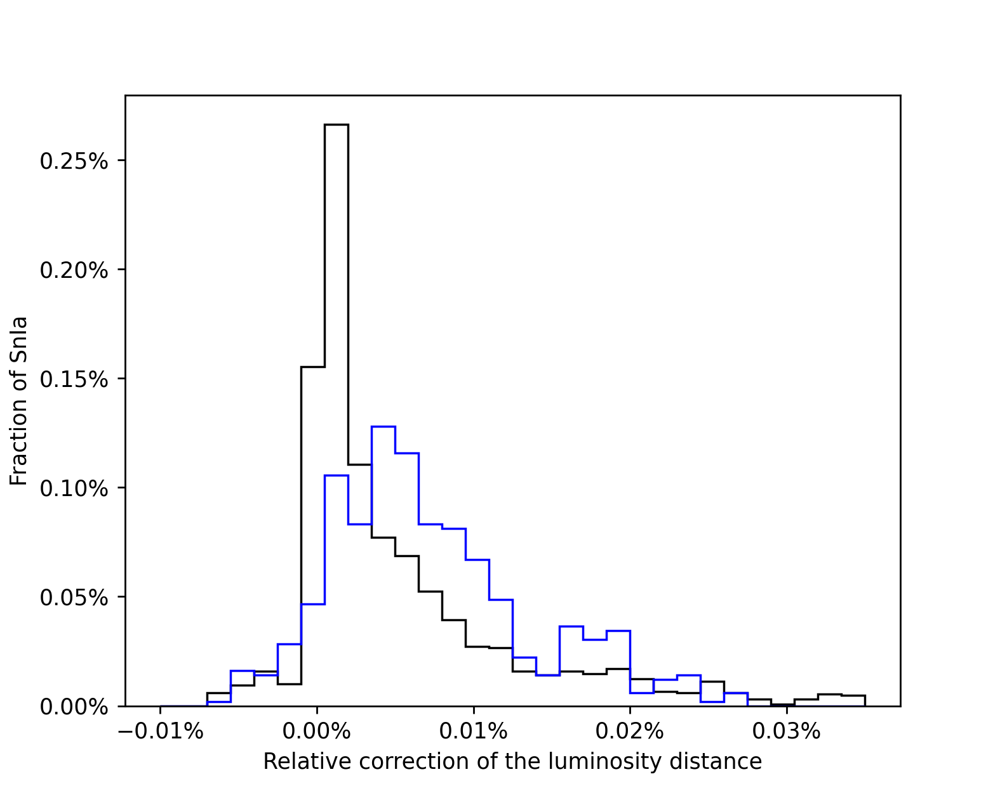

1701


In [44]:
fig = plt.figure(figsize=(6.3,5.0))
weights1=np.ones_like(SN1alumdistcorr)/float(len(SN1alumdistcorr))
weights2=np.ones_like(SN1aH0lumdistcorr)/float(len(SN1aH0lumdistcorr))
print(len(weights1))

plt.hist(SN1alumdistcorr,30,(-0.01,0.035),histtype='step',color='black',density=False,weights=weights1)
plt.hist(SN1aH0lumdistcorr,30,(-0.01,0.035),histtype='step',color='blue',density=False,weights=weights2)
plt.gca().xaxis.set_major_formatter(PercentFormatter(decimals=2))
plt.gca().yaxis.set_major_formatter(PercentFormatter(decimals=2))
plt.ylabel("Fraction of SnIa")
plt.xlabel("Relative correction of the luminosity distance")
plt.savefig('hist_corr_SnIa.png', dpi=300)


Plot the corrections as a function of the angle in the sky

<IPython.core.display.Javascript object>


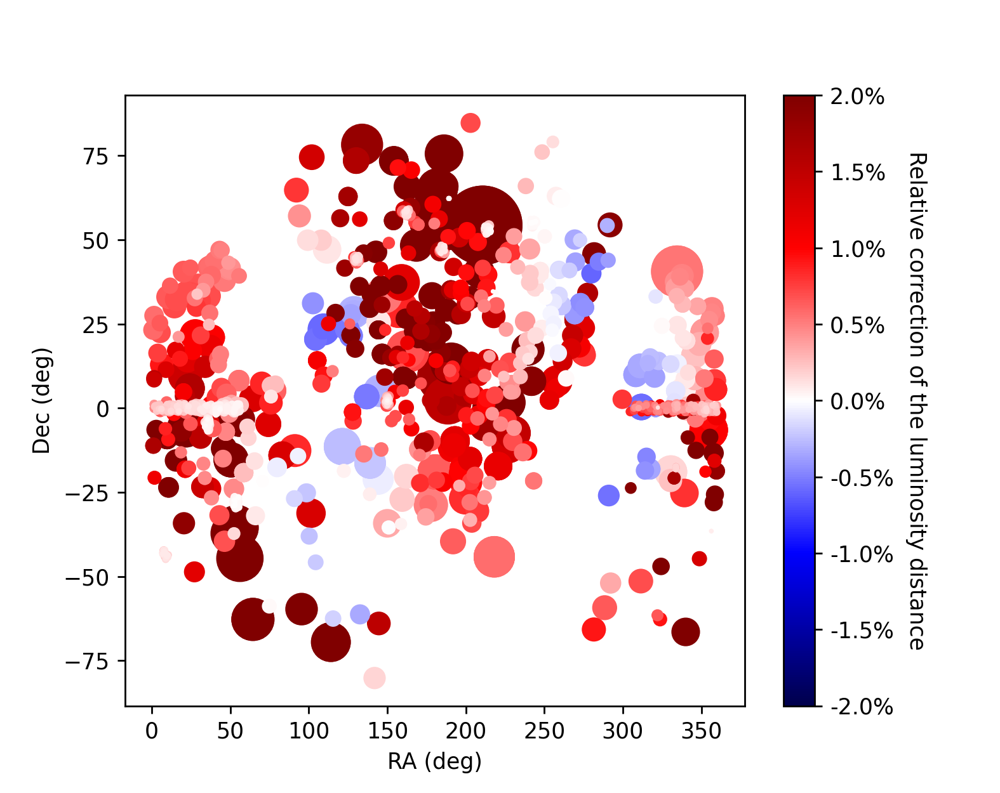

/var/folders/gm/yvqnp52d0dg0c6rgvbs833xh0000gp/T/ipykernel_26152/343540450.py:5: UserWarning:

FixedFormatter should only be used together with FixedLocator



In [45]:
fig = plt.figure(figsize=(6.3,5.0))
d01=plt.scatter(RA,Dec,c=SN1alumdistcorr,cmap=plt.cm.seismic,s=1.5/reds,vmin=-0.02,vmax=0.02)
cbar01 = plt.colorbar(d01)
cbar01.set_label('Relative correction of the luminosity distance', rotation=270,labelpad=15)
cbar01.ax.set_yticklabels(["{:.1%}".format(i) for i in cbar01.get_ticks()]) # set ticks of your format
plt.xlabel('RA (deg)')
plt.ylabel('Dec (deg)')
plt.savefig('Sn1a_corr_Radec.png', dpi=300)
plt.show()

<IPython.core.display.Javascript object>


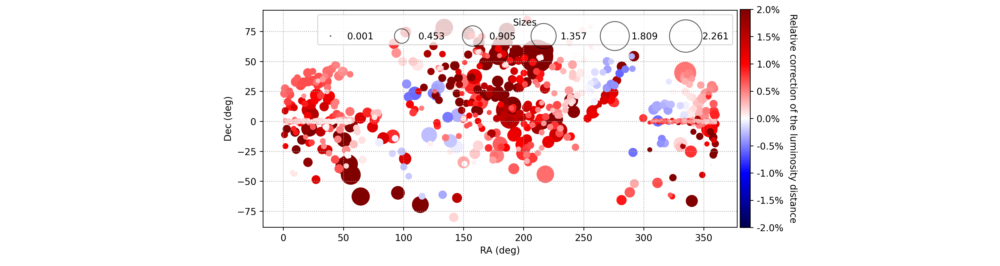

/var/folders/gm/yvqnp52d0dg0c6rgvbs833xh0000gp/T/ipykernel_26152/4101427625.py:6: UserWarning:

FixedFormatter should only be used together with FixedLocator

/var/folders/gm/yvqnp52d0dg0c6rgvbs833xh0000gp/T/ipykernel_26152/4101427625.py:18: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.



In [144]:
fig, ax = plt.subplots(figsize=(15, 4))
d01=ax.scatter(RA,Dec,c=SN1alumdistcorr,cmap=plt.cm.seismic,s=1.5/reds,vmin=-0.02,vmax=0.02)
cax2 = fig.add_axes([0.74, 0.145, 0.01, 0.82])
cbar01 = fig.colorbar(d01,cax=cax2)
cbar01.set_label('Relative correction of the luminosity distance', rotation=270,labelpad=15)
cbar01.ax.set_yticklabels(["{:.1%}".format(i) for i in cbar01.get_ticks()]) # set ticks of your format
ax.set_aspect(1)
ax.set_xlabel('RA (deg)')
ax.set_ylabel('Dec (deg)')
fontprops = fm.FontProperties(size=8, family='monospace')
ax.grid(visible=True, which='both', color='0.65',linestyle=':')
# plt.legend(*d01.legend_elements("sizes", num=6))
tick_list = np.linspace(min(1.5/reds),max(1.5/reds),6)
lab_list=np.linspace(min(reds),max(reds),6)
handles, labels = d01.legend_elements(prop="sizes", alpha=0.6, num=tick_list,markeredgecolor="black",mfc="none")
labels = np.round(lab_list,3)      
legend = ax.legend(handles, labels, loc="upper right", title="Sizes", ncol=6)
plt.tight_layout()
plt.savefig('Sn1a_corr_Radec.png', dpi=300,bbox_inches='tight')
plt.show()

In [134]:
max(1.5/reds)
min(1.5/reds)
np.mean(1.5/reds)

43.07202019609874

<IPython.core.display.Javascript object>


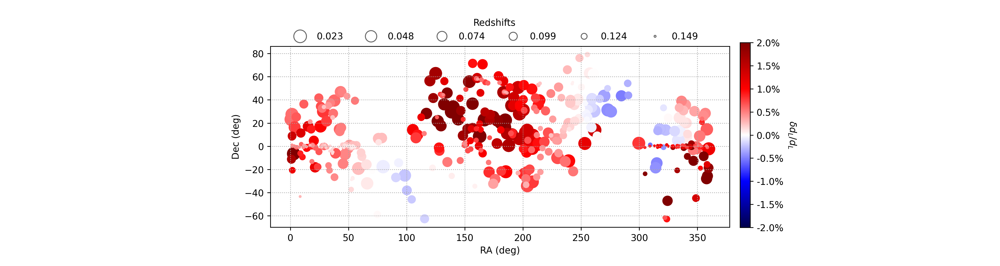

/var/folders/gm/yvqnp52d0dg0c6rgvbs833xh0000gp/T/ipykernel_26152/1923566241.py:6: UserWarning:

FixedFormatter should only be used together with FixedLocator

/var/folders/gm/yvqnp52d0dg0c6rgvbs833xh0000gp/T/ipykernel_26152/1923566241.py:18: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.



In [180]:
fig, ax = plt.subplots(figsize=(15, 4))
d01=plt.scatter(RAH0,DecH0,c=SN1aH0lumdistcorr,cmap=plt.cm.seismic,s=0.1/(redsH0)**2,vmin=-0.02,vmax=0.02)
cax2 = fig.add_axes([0.74, 0.145, 0.01, 0.695])
cbar01 = fig.colorbar(d01,cax=cax2)
cbar01.set_label(r'$\delta d_L/d_L$', rotation=270,labelpad=15)#,size=20)
cbar01.ax.set_yticklabels(["{:.1%}".format(i) for i in cbar01.get_ticks()]) # set ticks of your format
ax.set_aspect(1)
ax.set_xlabel('RA (deg)')
ax.set_ylabel('Dec (deg)')
fontprops = fm.FontProperties(size=8, family='monospace')
ax.grid(visible=True, which='both', color='0.65',linestyle=':')
# plt.legend(*d01.legend_elements("sizes", num=6))
tick_list = np.linspace(min(0.1/(redsH0)**2),max(0.1/(redsH0)**2),6)
lab_list=np.linspace(max(redsH0),min(redsH0),6)
handles, labels = d01.legend_elements(prop="sizes", alpha=0.6, num=tick_list,markeredgecolor="black",mfc="none")
labels = np.round(lab_list,3)      
legend = ax.legend(handles[::-1], labels[::-1], loc="upper right", title="Redshifts", ncol=6,bbox_to_anchor=(0.95, 1.2),frameon=False)
plt.tight_layout()
plt.savefig('Sn1aH0_corr_Radec.png', dpi=300,bbox_inches='tight')
plt.show()


<IPython.core.display.Javascript object>


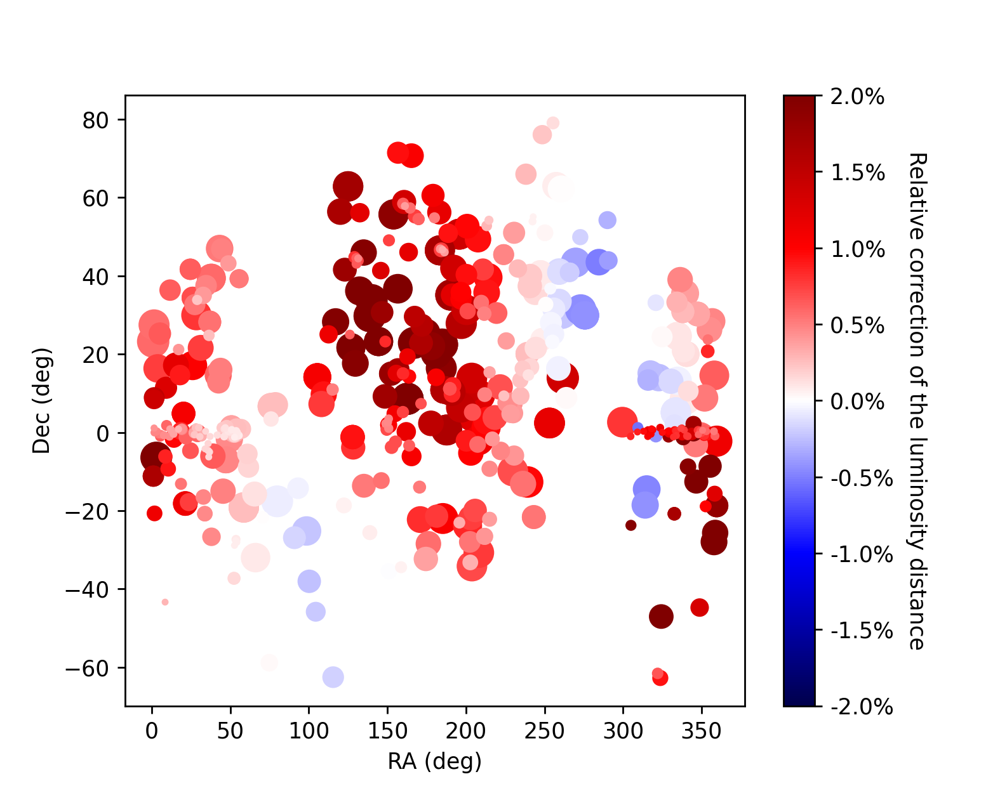

/var/folders/gm/yvqnp52d0dg0c6rgvbs833xh0000gp/T/ipykernel_26152/1069577459.py:5: UserWarning:

FixedFormatter should only be used together with FixedLocator



In [48]:
fig = plt.figure(figsize=(6.3,5.0))
d01=plt.scatter(RAH0,DecH0,c=SN1aH0lumdistcorr,cmap=plt.cm.seismic,s=0.1/(redsH0)**2,vmin=-0.02,vmax=0.02)
cbar01 = plt.colorbar(d01)
cbar01.set_label('Relative correction of the luminosity distance', rotation=270,labelpad=15)
cbar01.ax.set_yticklabels(["{:.1%}".format(i) for i in cbar01.get_ticks()]) # set ticks of your format

plt.xlabel('RA (deg)')
plt.ylabel('Dec (deg)')
plt.savefig('Sn1aH0_corr_Radec.png', dpi=300)
plt.show()

Fits for H0

In [49]:
lumcorr=np.array(SN1aH0lumdistcorr)
deltamuB1=5*np.log10(1+lumcorr)
_z=redsH0
_q0= -0.55


def HD_likelihood(cosmog):
    _H0=cosmog
    dlfit=c*_z*(1+0.5*(1-_q0)*_z)/_H0
    
    return -0.5*np.sum((muH0 - (5*np.log10(dlfit) +25))**2 /(muH0err)**2)

start = np.array([67])
result = basinhopping(
    lambda *args: -HD_likelihood(*args),
    start,
    niter_success=10,
    niter=100,
    stepsize=0.005,
    minimizer_kwargs={
        "method": "Nelder-Mead",
        "tol": 1.0e-4,
        "options": {"maxiter": 40000, "xatol": 1.0e-4, "fatol": 1.0e-4},
        },
)
print("#-------------- Best-fit-FLRW---------------")
print(result)
bestfithub=result.x
print(bestfithub)

def HD_likelihoodb1(cosmog):
    _H0=cosmog
    dlfit=c*_z*(1+0.5*(1-_q0)*_z)/_H0
    return -0.5*np.sum((muH0 - (5*np.log10((dlfit)*(1+lumcorr)) +25))**2 /(muH0err)**2)

start = np.array([67])
result = basinhopping(
    lambda *args: -HD_likelihoodb1(*args),
    start,
    niter_success=10,
    niter=100,
    stepsize=0.005,
    minimizer_kwargs={
        "method": "Nelder-Mead",
        "tol": 1.0e-4,
        "options": {"maxiter": 40000, "xatol": 1.0e-4, "fatol": 1.0e-4},
        },
)
print("#-------------- Best-fit-B1+FLRW---------------")
print(result)
bestfithub2=result.x
print(bestfithub2)


#-------------- Best-fit-FLRW---------------
                    message: ['success condition satisfied']
                    success: True
                        fun: 115.06508878351814
                          x: [ 7.275e+01]
                        nit: 13
      minimization_failures: 0
                       nfev: 478
 lowest_optimization_result:       message: Optimization terminated successfully.
                                   success: True
                                    status: 0
                                       fun: 115.06508878351814
                                         x: [ 7.275e+01]
                                       nit: 17
                                      nfev: 34
                             final_simplex: (array([[ 7.275e+01],
                                                   [ 7.275e+01]]), array([ 1.151e+02,  1.151e+02]))
[72.7479355]
#-------------- Best-fit-B1+FLRW---------------
                    message: ['success condition satisfi

Simulate an homogeneous, isotropic full sky distribution of sources in the sky and computes the correction for them

In [50]:
from astropy.coordinates import CartesianRepresentation, SkyCoord

def convert_supergalactic_cartesian_to_radec(sgx, sgy, sgz):
    # Create a CartesianRepresentation object with the input Cartesian coordinates
    cartesian_coord = CartesianRepresentation(sgx, sgy, sgz,unit=unit.Mpc)

    # Create a SkyCoord object from the Cartesian coordinates assuming the supergalactic frame
    supergalactic_coord = SkyCoord(cartesian_coord, frame="supergalactic")

    # Convert the supergalactic coordinates to ICRS (RA and Dec)
    icrs_coord = supergalactic_coord.icrs

    # Extract the RA and Dec values
    ra = icrs_coord.ra.degree
    dec = icrs_coord.dec.degree

    return ra, dec

# Hmin1=[convert_supergalactic_cartesian_to_radec(sgx_cap,sgy_cap,sgz_cap)[0][0],
# convert_supergalactic_cartesian_to_radec(sgx_cap,sgy_cap,sgz_cap)[1][0]]
# Hnull1=[convert_supergalactic_cartesian_to_radec(sgx_cap,sgy_cap,sgz_cap)[0][1],
# convert_supergalactic_cartesian_to_radec(sgx_cap,sgy_cap,sgz_cap)[1][1]]
# Hmax1=[convert_supergalactic_cartesian_to_radec(sgx_cap,sgy_cap,sgz_cap)[0][2],
# convert_supergalactic_cartesian_to_radec(sgx_cap,sgy_cap,sgz_cap)[1][2]]
# Hmin2=[convert_supergalactic_cartesian_to_radec(sgx_cap,sgy_cap,sgz_cap)[0][3],
# convert_supergalactic_cartesian_to_radec(sgx_cap,sgy_cap,sgz_cap)[1][3]]
# Hnull2=[convert_supergalactic_cartesian_to_radec(sgx_cap,sgy_cap,sgz_cap)[0][4],
# convert_supergalactic_cartesian_to_radec(sgx_cap,sgy_cap,sgz_cap)[1][4]]
# Hmax2=[convert_supergalactic_cartesian_to_radec(sgx_cap,sgy_cap,sgz_cap)[0][5],
# convert_supergalactic_cartesian_to_radec(sgx_cap,sgy_cap,sgz_cap)[1][5]]

fakeRA= np.arange(0,360,20)
fakeDec= np.arange(-90,90,10)
fakereds= np.arange(0.01,0.1,0.01)
fakesn=[]
for i in range(len(fakereds)):
    for j in range(len(fakeDec)):
        for k in range(len(fakeRA)):
            fakesn.append(np.array([fakereds[i],fakeRA[j],fakeDec[k]]))
RAfdf=[]
for i in range(len(fakesn)):
    RAfdf.append(np.array(fakesn[i][1]))
Decfdf=[]
for i in range(len(fakesn)):
    Decfdf.append(np.array(fakesn[i][2]))
Redsfdf=[]
for i in range(len(fakesn)):
    Redsfdf.append(np.array(fakesn[i][0]))
fakedists=ztochi(Redsfdf)
print(len(Redsfdf))

coordsfake = SkyCoord(RAfdf*unit.deg, Decfdf*unit.deg, distance=fakedists*unit.Mpc).transform_to('supergalactic')
coordsfake.representation_type = 'cartesian'
fakeSN1apositions=[]
for i in range(len(RAfdf)):
    fakeSN1apositions.append( [coordsfake.sgx.value[i],coordsfake.sgy.value[i],coordsfake.sgz.value[i]])
fakeSN1alumdistcorr=[]
for i in range(len(RAfdf)):
    fakeSN1alumdistcorr.append(comovingdistancecorrection(fakeSN1apositions[i],MW,bestfit[0],bestfit[1],bestfit[2]))
print(len(RAfdf))


2916
2916


<IPython.core.display.Javascript object>


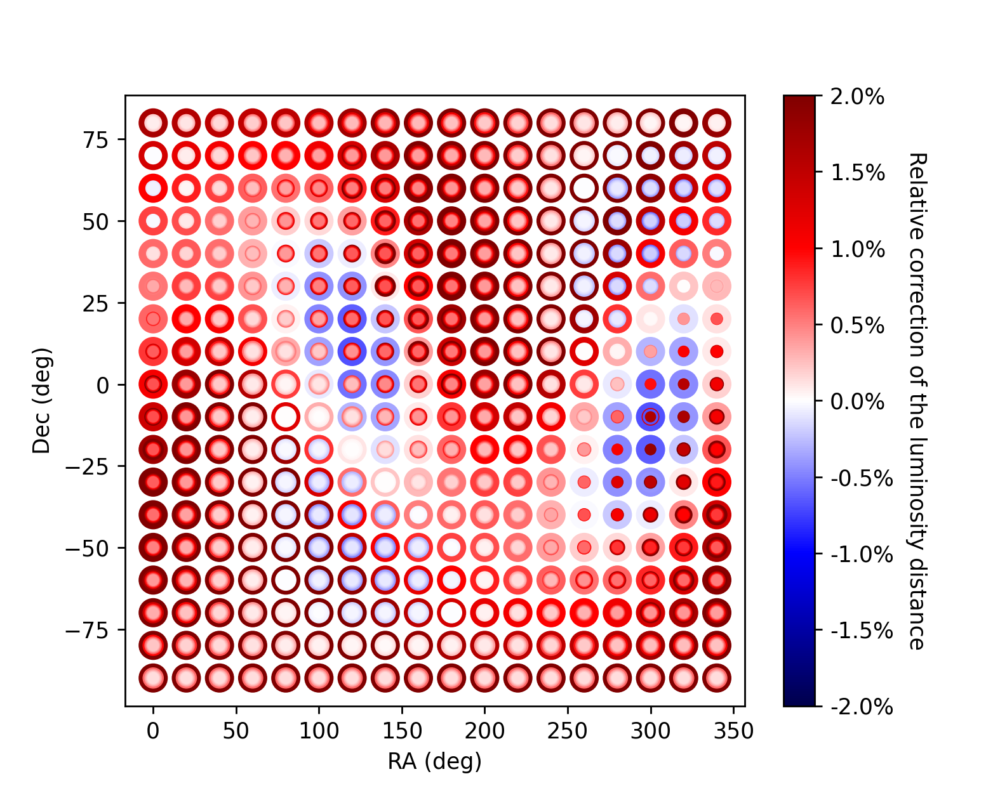

[150.         150.         150.         ...  16.66666667  16.66666667
  16.66666667]


/var/folders/gm/yvqnp52d0dg0c6rgvbs833xh0000gp/T/ipykernel_26152/2660245040.py:7: UserWarning:

FixedFormatter should only be used together with FixedLocator



In [51]:
fig = plt.figure(figsize=(6.3,5.0))
Sqrreds=1.5/np.array(Redsfdf)
print(Sqrreds)
xyztw=plt.scatter(RAfdf,Decfdf,c=fakeSN1alumdistcorr,cmap=plt.cm.seismic,vmin=-0.02,vmax=0.02,s=Sqrreds)
cbar02 = plt.colorbar(xyztw)
cbar02.set_label('Relative correction of the luminosity distance', rotation=270,labelpad=15)
cbar02.ax.set_yticklabels(["{:.1%}".format(i) for i in cbar01.get_ticks()]) # set ticks of your format
# plt.scatter(Hmin1[0],Hmin1[1],color='yellowgreen',s=50,marker='^')
# plt.scatter(Hmax1[0],Hmax1[1],color='gold',s=50,marker='^')
# plt.scatter(Hnull1[0],Hnull1[1],color='royalblue',s=50,marker='^')
# plt.scatter(Hmin2[0],Hmin2[1],color='yellowgreen',s=50,marker='^')
# plt.scatter(Hmax2[0],Hmax2[1],color='gold',s=50,marker='^')
# plt.scatter(Hnull2[0],Hnull2[1],color='royalblue',s=50,marker='^')
# # plt.scatter(218.17342898,-89.85814263,color='pink',s=100,marker='*')
# plt.scatter(167,-7,color='yellow',s=100,marker='*')
# plt.scatter(126.86062284,-57.57730975,color='green',s=100,marker='*')

plt.xlabel('RA (deg)')
plt.ylabel('Dec (deg)')
plt.savefig('Fullsky_dist.png', dpi=300)
plt.show()

Read SBF data from ???? and computes the corrections repeating the analysis done for Pantheon+

In [53]:
sbf = pd.read_csv("sbf_data.csv")
c = 299792.458
sbfreds= (sbf.vgroup_cmb)/c
sbfRA=np.array(sbf.RA)
sbfDEC=np.array(sbf.DEC)
sbfobsdl=sbf.d_obs
sbfMU=sbf.mu_obs
sbfdlERR=np.array(sbf.d_obs_err)
print(sbfRA,sbfDEC)
chisbf=ztochi(sbfreds)
dlsbf=(1+sbfreds)*chisbf
# lumdistsbf= 10**(sbfMU/5-5)

sbfobs=np.array(sbfobsdl)
_z=np.array(sbfreds)

residuals_flrw_sbf= (sbfobsdl-dlsbf)/dlsbf

coordsbf = SkyCoord(sbfRA*unit.deg, sbfDEC*unit.deg, distance=chisbf*unit.Mpc).transform_to('supergalactic')
coordsbf.representation_type = 'cartesian'

SBFpositions=[]
for i in range(len(sbfRA)):
    SBFpositions.append( [coordsbf.sgx.value[i],coordsbf.sgy.value[i],coordsbf.sgz.value[i]])

SBFlumdistcorr=[]
for i in range(len(sbfRA)):
    SBFlumdistcorr.append(comovingdistancecorrection(SBFpositions[i],MW,bestfit[0],bestfit[1],bestfit[2]))

sbfcorr=np.array(SBFlumdistcorr)


def SBFLikelihoodHD(cosmog):
    _H0=cosmog,
    dlfit=c*_z*(1+0.5*(1-_q0)*_z)/_H0     
    return -0.5*np.sum((sbfobs - dlfit)**2 /(sbfdlERR)**2)


def SBFLikelihoodLanHD(cosmog):
    _H0=cosmog
    dlfit=c*_z*(1+0.5*(1-_q0)*_z)/_H0     
    return -0.5*np.sum((sbfobs - dlfit*(1+sbfcorr))**2 /(sbfdlERR)**2)

start = np.array([67])
result = basinhopping(
    lambda *args: -SBFLikelihoodHD(*args),
    start,
    niter_success=10,
    niter=100,
    stepsize=0.005,
    minimizer_kwargs={
        "method": "Nelder-Mead",
        "tol": 1.0e-4,
        "options": {"maxiter": 40000, "xatol": 1.0e-4, "fatol": 1.0e-4},
        },
)
print("#-------------- Best-fit-FLRW---------------")
print(result)
bestfithub=result.x
print(bestfithub)
start = np.array([67])
result = basinhopping(
    lambda *args: -SBFLikelihoodLanHD(*args),
    start,
    niter_success=10,
    niter=100,
    stepsize=0.005,
    minimizer_kwargs={
        "method": "Nelder-Mead",
        "tol": 1.0e-4,
        "options": {"maxiter": 40000, "xatol": 1.0e-4, "fatol": 1.0e-4},
        },
)
print("#-------------- Best-fit-Lan---------------")
print(result)
bestfithub=result.x
print(bestfithub)

[159.447716   3.878617  14.45368   16.853995  17.745435  20.733333
  20.916277  21.198833  21.380667  21.496333  21.502636  26.23375
  28.193667  29.087639  30.062091  31.079039  35.504208  36.361583
  39.5815    40.812708  43.614068  45.426538  45.977     46.03325
  49.321996  49.838708  49.975625  56.613542  68.766625  67.916417
  73.129792  74.23464  101.940833 101.822375 107.795129 120.602805
 132.341208 134.246955 136.902677 145.224729 153.460497 162.762509
 165.796708 176.008958 180.361472 181.112773 186.118125 194.351506
 194.898779 195.178958 197.44875  207.313621 208.361221 212.488728
 214.607183 226.364541 267.953375 281.739917 311.85125  319.637708
 333.91875  350.060549 132.649375] [-27.081695  17.328519  30.352448  32.412559  33.151892  33.471667
  33.256062   9.538833   1.759111  -1.340222  -1.345159  10.423028
  36.151833   5.628938  31.429571  -8.735293  33.266056  41.824278
   2.11925   32.424972  41.57959   35.205744 -11.991806 -26.069639
  41.385489  41.490639  41.56

In [ ]:
fig = plt.figure(figsize=(6.3,5.0))
weights=np.ones_like(SBFlumdistcorr)/float(len(SBFlumdistcorr))
plt.hist(SBFlumdistcorr,20,(-0.02,0.04),histtype='step',color='black',density=False,weights=weights)
plt.ylabel("Fraction of SBF")
plt.xlabel("Relative correction of the luminosity distance")
plt.yticks([0.05, 0.10, 0.15, 0.20])
plt.gca().xaxis.set_major_formatter(PercentFormatter(decimals=2))
plt.gca().yaxis.set_major_formatter(PercentFormatter(decimals=2))
# plt.grid()
plt.savefig('hist_corr_SBFH0.png', dpi=300)
plt.show()

In [ ]:
fig = plt.figure()
datpointsbf=plt.scatter(sbfRA,sbfDEC,c=SBFlumdistcorr,cmap=plt.cm.seismic,s=0.005/(sbfreds)**2,vmin=-0.02,vmax=0.02)
cbar02 = plt.colorbar(datpointsbf)
cbar02.set_label('Relative correction of the luminosity distance', rotation=270,labelpad=15)
cbar02.ax.set_yticklabels(["{:.1%}".format(i) for i in cbar01.get_ticks()]) # set ticks of your format
plt.xlabel('RA (deg)')
plt.ylabel('Dec (deg)')
plt.savefig('sbf_corr_Radec.png', dpi=300)
plt.show()

Here we repeat the analysis of PV data and the fit for the rate of expansion inside using a spherical model rather than a triaxial one to assess the impact of anisotropies.

In [ ]:
def recvelsphsmoothlike(vert,_xc,_yc,_zc,Hsph,a,b):

    centre = np.array([_xc,_yc,_zc])
    rotated_vert = np.einsum('lvi,ij->lvj', vert-centre[None,None,:],R.T)   # Has shape (len(coords[:,0],8,3))
    rotated_dist = np.sqrt(np.sum((vert-centre[None,None,:])**2, axis=-1))  # Has shape (len(coords[:,0],8))
    Sphrvel = (Hsph*rotated_vert[:,:,0]**2 + Hsph*rotated_vert[:,:,1]**2 + Hsph*rotated_vert[:,:,2]**2) / (rotated_dist+0.0000000001)
    return (1/8)*np.sum(Sphrvel, axis=-1)   # Returns an array of shape (len(coords[:,0]))

def smlog_Sphlikelihood(Hi):
    Hsph,a,b = Hi
    smsphmodel=recvelsphsmoothlike(vert,0,0,0,Hsph,a,b)        
    return -0.5*np.sum((lania_rad_vel - smsphmodel)**2 /errorsinlan**2)
#Compute the best fit for the sphere        
start = np.array([0,0,0])
resultsph = basinhopping(
    lambda *args: -smlog_Sphlikelihood(*args),
    start,
    niter_success=10,
    niter=100,
    stepsize=0.005,
    minimizer_kwargs={
        "method": "Nelder-Mead",
        "tol": 1.0e-4,
        "options": {"maxiter": 40000, "xatol": 1.0e-4, "fatol": 1.0e-4},
        },
)
print("#-------------- Best-fit-sphere---------------")
print(resultsph)
bestfitsph=resultsph.x
print(bestfitsph)

#Now we define prior and posterior for the MCMC spherical analysis
import emcee

def log_priorSph(Hi):
    Hi
    if -6.0 < Hi[0] < 6 and -6.0 < Hi[1] < 6.0 and -6.0 < Hi[2] < 6.0:
        return 0.0
    return -np.inf

def smlog_probabilitySPH(Hi):
    lpsph = log_priorSph(Hi)
    if not np.isfinite(lpsph):
        return -np.inf
    return lpsph + smlog_Sphlikelihood(Hi)

import emcee

possph = bestfitsph + 1e-4 * np.random.randn(32, 3)
nwalkerssp, ndimsp = possph.shape
samplersp = emcee.EnsembleSampler(
    nwalkerssp, ndimsp, smlog_probabilitySPH
)

samplersp.run_mcmc(possph, 5000, progress=True);

In [ ]:
fig, axes = plt.subplots(3, figsize=(10, 7), sharex=True)
samples = samplersp.get_chain()
labels = ["Hsph", "a", "b"]
for i in range(ndim):
    ax = axes[i]
    ax.plot(samples[:, :, i], "k", alpha=0.3)
    ax.set_xlim(0, len(samples))
    ax.set_ylabel(labels[i])
    ax.yaxis.set_label_coords(-0.1, 0.5)

axes[-1].set_xlabel("step number");
flat_samples = samplersp.get_chain(discard=100, thin=15, flat=True)
print(flat_samples.shape)

In [ ]:
fig = corner.corner(
    flat_samples, labels=labels, truths=bestfit
);
errorbarsup=[]
errorbarsdown=[]
for i in range(ndim):
    mcmc = np.percentile(flat_samples[:, i], [16, 50, 84])
    q = np.diff(mcmc)
    txt = "\mathrm{{{3}}} = {0:.3f}_{{-{1:.3f}}}^{{{2:.3f}}}"
    txt = txt.format(mcmc[1], q[0], q[1], labels[i])
    display(Math(txt))
    errorbarsup.append(q[1])
    errorbarsdown.append(-q[0])

gaussianerr=np.round((np.array(errorbarsup) -np.array(errorbarsdown))/2,3)